# DDPM (Denoising Diffusion Probabilistic Models) with CIFAR10

https://arxiv.org/abs/2006.11239

In [ ]:
import copy
import math
import matplotlib.pyplot as plt
import torch
import torch.nn as nn
import torch.nn.functional as F
from torchvision import datasets, transforms, utils
from torch.utils.data import DataLoader


# ----------------------------------------------------------------------
# Residual Block with Group Normalization
# ----------------------------------------------------------------------
class ResidualBlock(nn.Module):
    def __init__(self, in_ch, out_ch, t_dim):
        super().__init__()

        # Residual Block with Group Normalization
        self.block1 = nn.Sequential(
            nn.Conv2d(in_ch, out_ch, 3, padding=1),
            nn.GroupNorm(32, out_ch),
            nn.SiLU()
        )

        self.block2 = nn.Sequential(
            nn.Conv2d(out_ch, out_ch, 3, padding=1),
            nn.GroupNorm(32, out_ch),
            nn.SiLU(),
            nn.Dropout(0.1)  # Add dropout
        )

        # MLP to linearly transform time step embedding
        self.time_mlp = nn.Linear(t_dim, out_ch)

        # Shortcut connection
        if in_ch != out_ch:
            # If input and output channels are different, adjust with 1x1 convolution
            self.shortcut = nn.Conv2d(in_ch, out_ch, 1)
        else:
            # If input and output channels are the same, use identity mapping
            self.shortcut = nn.Identity()

    def forward(self, x, t_emb):
        h = self.block1(x)
        h = h + self.time_mlp(t_emb)[:, :, None, None]
        h = self.block2(h)
        return h + self.shortcut(x)  # Add residual connection


# ----------------------------------------------------------------------
# Self-Attention Block
# ----------------------------------------------------------------------
class SelfAttention(nn.Module):
    def __init__(self, ch):
        super().__init__()

        # Self-Attention Block using 1x1 Convolutions
        # Q, K, V projections and output projection
        self.q = nn.Conv2d(ch, ch, 1)
        self.k = nn.Conv2d(ch, ch, 1)
        self.v = nn.Conv2d(ch, ch, 1)
        self.proj = nn.Conv2d(ch, ch, 1)

    def forward(self, x):
        B, C, H, W = x.shape

        # Reshape and permute for attention calculation
        q = self.q(x).reshape(B, C, H*W).permute(0,2,1)   # (B, HW, C)
        k = self.k(x).reshape(B, C, H*W)                  # (B, C, HW)
        v = self.v(x).reshape(B, C, H*W).permute(0,2,1)   # (B, HW, C)

        attn = torch.bmm(q, k) / (C ** 0.5)               # (B, HW, HW)
        attn = attn.softmax(dim=-1)

        out = torch.bmm(attn, v)                          # (B, HW, C)
        out = out.permute(0,2,1).reshape(B, C, H, W)
        out = self.proj(out)

        return out + x  # Add residual connection


# ----------------------------------------------------------------------
# Encoder Block (Downsampling)
# ----------------------------------------------------------------------
class Encode(nn.Module):
    def __init__(self, in_ch, out_ch, t_emb_dim, atten=False, down=True):
        super().__init__()
 
        self.block1 = ResidualBlock(in_ch, out_ch, t_emb_dim)
        self.block2 = ResidualBlock(out_ch, out_ch, t_emb_dim)
        self.atten  = SelfAttention(out_ch) if atten else nn.Identity()
        self.down   = nn.Conv2d(out_ch, out_ch, 3, 2, 1) \
            if down else nn.Identity()

    def forward(self, x, t_emb):
        x = self.block1(x, t_emb)
        x = self.block2(x, t_emb)
        x = self.atten(x)
        return self.down(x), x  # For concatenation in upsampling


# ----------------------------------------------------------------------
# Decoder Block (Upsampling)
# ----------------------------------------------------------------------
class Decode(nn.Module):
    def __init__(self, in_ch, out_ch, t_emb_dim, atten=False):
        super().__init__()

        self.up = nn.Sequential(
            nn.Upsample(scale_factor=2, mode='nearest'),
            nn.Conv2d(in_ch, out_ch, 3, padding=1)  # Upsampling
        )
        self.block1 = ResidualBlock(out_ch*2, out_ch, t_emb_dim)
        self.block2 = ResidualBlock(out_ch, out_ch, t_emb_dim)
        self.atten  = SelfAttention(out_ch) if atten else nn.Identity()

    def forward(self, x, t_emb, skip):
        x = self.up(x)
        x = torch.cat([x, skip], dim=1)  # Skip connection from encoder
        x = self.block1(x, t_emb)
        x = self.block2(x, t_emb)
        x = self.atten(x)
        return x


# ----------------------------------------------------------------------
# Sinusoidal Time Encoding
# ----------------------------------------------------------------------
def sinusoidal_time_encoding(t: torch.Tensor, dim: int) -> torch.Tensor:
    # dim must be even
    half_dim = dim // 2

    # Indices along the embedding dimension
    indices = torch.arange(half_dim, dtype=torch.float32, device=t.device)

    # Calculate scales based on indices
    scales = torch.exp(-math.log(10000.0) * indices / (half_dim - 1))

    # Scale time steps (equivalent to angles in the sinusoidal function)
    angles = t[:, None].float() * scales[None, :]

    # Sinusoidal encoding of time steps
    enc = torch.zeros(t.shape[0], dim, device=t.device)
    enc[:, 0::2] = torch.sin(angles)
    enc[:, 1::2] = torch.cos(angles)
    return enc



# ----------------------------------------------------------------------
# Time Embedding MLP
# ----------------------------------------------------------------------
class TimeEmbedding(nn.Module):
    def __init__(self, t_dim):
        super().__init__()
        self.t_dim = t_dim
        self.mlp = nn.Sequential(
            nn.Linear(t_dim, t_dim * 4),
            nn.SiLU(),
            nn.Linear(t_dim * 4, t_dim),
        )

    def forward(self, t):
        emb = sinusoidal_time_encoding(t, self.t_dim)
        return self.mlp(emb)


# ----------------------------------------------------------------------
# U-Net Architecture Definition
# ----------------------------------------------------------------------
class UNet(nn.Module):
    def __init__(self, image_ch: int, base_ch: int, t_dim: int):
        super().__init__()

        # Time step embedding
        self.time_mlp = TimeEmbedding(t_dim)

        # Encoder
        self.enc1 = Encode(image_ch , base_ch  , t_dim)
        self.enc2 = Encode(base_ch  , base_ch*2, t_dim, atten=True)
        self.enc3 = Encode(base_ch*2, base_ch*2, t_dim)

        # Bottleneck
        self.neck = Encode(base_ch*2, base_ch*2, t_dim, down=False)

        # Decoder
        self.dec1 = Decode(base_ch*2, base_ch*2, t_dim)
        self.dec2 = Decode(base_ch*2, base_ch*2, t_dim, atten=True)
        self.dec3 = Decode(base_ch*2, base_ch  , t_dim)

        # Output
        self.out_conv = nn.Conv2d(base_ch, image_ch, 1)

    def forward(self, x, t):
        # Time step embedding
        t_emb = self.time_mlp(t)

        # Encoder
        x, skip1 = self.enc1(x, t_emb)
        x, skip2 = self.enc2(x, t_emb)
        x, skip3 = self.enc3(x, t_emb)

        # Bottleneck
        x, _ = self.neck(x, t_emb)

        # Decoder
        x = self.dec1(x, t_emb, skip3)
        x = self.dec2(x, t_emb, skip2)
        x = self.dec3(x, t_emb, skip1)

        return self.out_conv(x)

## Forward and Backward Process

In [ ]:
# ----------------------------------------------------------------------
# Choose device for computation
# ----------------------------------------------------------------------
if torch.backends.mps.is_available():
   device = torch.device("mps")
elif torch.cuda.is_available():
   device = torch.device("cuda:1")
else:
   device = torch.device("cpu")
print(f"Using device: {device}")


# ----------------------------------------------------------------------
# Diffusion schedule
# ----------------------------------------------------------------------
T = 1000     # Number of time steps
beta_start = 1e-4
beta_end = 0.02

betas = torch.linspace(beta_start, beta_end, T).to(device)
alphas = 1. - betas
alpha_bars = torch.cumprod(alphas, dim=0)  # 累積積


# ----------------------------------------------------------------------
# Forward process P(x_t | x_0)
# ----------------------------------------------------------------------
def sample_q(
    x_0: torch.Tensor,  # Image data (batch, channels, height, width)
    t: torch.Tensor,    # Time steps (tensor for batch size)
):
    # Generate noise with the same shape as x_0 (batch, channels, height, width)
    epsilon = torch.randn_like(x_0)

    # Get alpha_bar corresponding to t (reshape to 4D tensor)
    alpha_bar_t = alpha_bars[t].view(-1, 1, 1, 1)

    # Generate noisy image
    x_t = (alpha_bar_t.sqrt() * x_0 + (1 - alpha_bar_t).sqrt() * epsilon)

    # Return noise as label
    return x_t, epsilon


# ----------------------------------------------------------------------
# Reverse process P_θ(x_{t-1} | x_t) sampling from the generative process
# ----------------------------------------------------------------------
def sample_p(
    x_t: torch.Tensor,  # Noisy image (batch, channels, height, width)
    t: torch.Tensor,    # Time steps (tensor for batch size)
    noise_pred: torch.Tensor  # Model noise prediction (batch, channels, height, width)
):
    # Get alpha_bar and beta corresponding to t (reshape to 4D tensor)
    beta = betas[t].view(-1, 1, 1, 1)
    alpha = alphas[t].view(-1, 1, 1, 1)
    s1_ab = torch.sqrt(1 - alpha_bars[t]).view(-1, 1, 1, 1)

    # Calculate mean
    mean = (1 / torch.sqrt(alpha)) * (x_t - beta / s1_ab * noise_pred)

    # Step 0 does not add noise (deterministic output)
    mask = (t != 0).float().view(-1, 1, 1, 1)

    # Add noise for sampling
    noise = torch.randn_like(x_t)
    return mean + torch.sqrt(beta) * noise * mask


# ----------------------------------------------------------------------
# Sampling function (image generation)
# ----------------------------------------------------------------------
def sample(model: nn.Module, x: torch.Tensor):
    # x is the noisy image (batch, channels, height, width)
    n_samples = x.shape[0]

    # Sample time steps in reverse order
    for t_step in reversed(range(T)):
        # Convert time step to tensor
        t = torch.full((n_samples,), t_step, device=x.device, dtype=torch.long)

        # Perform noise prediction
        noise_pred = model(x, t)

        # Sample the next step image from the generative process
        x = sample_p(x, t, noise_pred)
    return x


# ----------------------------------------------------------------------
# Generate images
# ----------------------------------------------------------------------
def show_images(samples, n_images_per_row: int=None):
    if n_images_per_row is None:
        n_images_per_row = samples.shape[0]  # Default is the number of samples

    # Normalize image values to range [0, 1]
    samples = (samples + 1) / 2  # [-1, 1] -> [0, 1]
    samples = samples.clamp(0, 1)  # Clip to [0, 1]
    samples = samples.cpu()

    # Create a tensor for displaying in grid format
    grid = utils.make_grid(samples, nrow=n_images_per_row)

    # (B, C, H, W) -> (B, H, W, C)
    plt.imshow(grid.permute(1, 2, 0).numpy())
    plt.axis('off')
    plt.tight_layout()
    plt.show()

Using device: cuda:1


## Training Loop

Epoch 1/2000, Loss: 0.0595
Epoch 2/2000, Loss: 0.0600
Epoch 3/2000, Loss: 0.0353
Epoch 4/2000, Loss: 0.0379
Epoch 5/2000, Loss: 0.0257
Epoch 6/2000, Loss: 0.0454
Epoch 7/2000, Loss: 0.0343
Epoch 8/2000, Loss: 0.0246
Epoch 9/2000, Loss: 0.0423
Epoch 10/2000, Loss: 0.0394


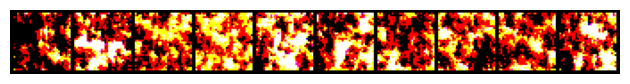

Epoch 11/2000, Loss: 0.0331
Epoch 12/2000, Loss: 0.0323
Epoch 13/2000, Loss: 0.0345
Epoch 14/2000, Loss: 0.0377
Epoch 15/2000, Loss: 0.0264
Epoch 16/2000, Loss: 0.0368
Epoch 17/2000, Loss: 0.0434
Epoch 18/2000, Loss: 0.0420
Epoch 19/2000, Loss: 0.0289
Epoch 20/2000, Loss: 0.0408


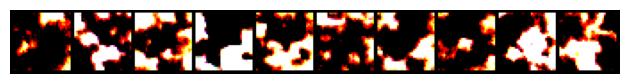

Epoch 21/2000, Loss: 0.0212
Epoch 22/2000, Loss: 0.0433
Epoch 23/2000, Loss: 0.0297
Epoch 24/2000, Loss: 0.0319
Epoch 25/2000, Loss: 0.0395
Epoch 26/2000, Loss: 0.0287
Epoch 27/2000, Loss: 0.0289
Epoch 28/2000, Loss: 0.0283
Epoch 29/2000, Loss: 0.0383
Epoch 30/2000, Loss: 0.0363


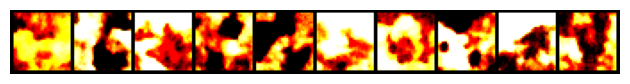

Epoch 31/2000, Loss: 0.0262
Epoch 32/2000, Loss: 0.0378
Epoch 33/2000, Loss: 0.0514
Epoch 34/2000, Loss: 0.0321
Epoch 35/2000, Loss: 0.0411
Epoch 36/2000, Loss: 0.0304
Epoch 37/2000, Loss: 0.0452
Epoch 38/2000, Loss: 0.0394
Epoch 39/2000, Loss: 0.0418
Epoch 40/2000, Loss: 0.0347


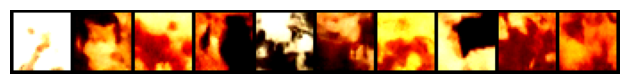

Epoch 41/2000, Loss: 0.0226
Epoch 42/2000, Loss: 0.0216
Epoch 43/2000, Loss: 0.0319
Epoch 44/2000, Loss: 0.0222
Epoch 45/2000, Loss: 0.0266
Epoch 46/2000, Loss: 0.0443
Epoch 47/2000, Loss: 0.0325
Epoch 48/2000, Loss: 0.0270
Epoch 49/2000, Loss: 0.0394
Epoch 50/2000, Loss: 0.0340


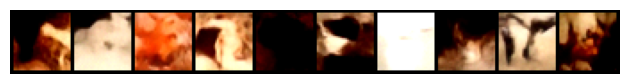

Epoch 51/2000, Loss: 0.0202
Epoch 52/2000, Loss: 0.0374
Epoch 53/2000, Loss: 0.0231
Epoch 54/2000, Loss: 0.0296
Epoch 55/2000, Loss: 0.0357
Epoch 56/2000, Loss: 0.0391
Epoch 57/2000, Loss: 0.0232
Epoch 58/2000, Loss: 0.0255
Epoch 59/2000, Loss: 0.0390
Epoch 60/2000, Loss: 0.0226


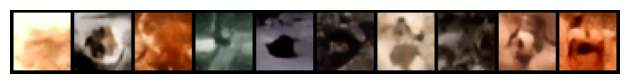

Epoch 61/2000, Loss: 0.0469
Epoch 62/2000, Loss: 0.0420
Epoch 63/2000, Loss: 0.0329
Epoch 64/2000, Loss: 0.0437
Epoch 65/2000, Loss: 0.0243
Epoch 66/2000, Loss: 0.0394
Epoch 67/2000, Loss: 0.0263
Epoch 68/2000, Loss: 0.0314
Epoch 69/2000, Loss: 0.0308
Epoch 70/2000, Loss: 0.0367


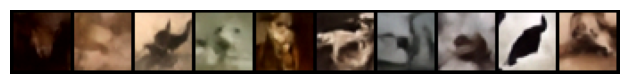

Epoch 71/2000, Loss: 0.0373
Epoch 72/2000, Loss: 0.0301
Epoch 73/2000, Loss: 0.0324
Epoch 74/2000, Loss: 0.0293
Epoch 75/2000, Loss: 0.0226
Epoch 76/2000, Loss: 0.0307
Epoch 77/2000, Loss: 0.0287
Epoch 78/2000, Loss: 0.0394
Epoch 79/2000, Loss: 0.0305
Epoch 80/2000, Loss: 0.0364


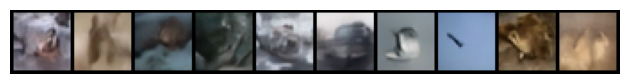

Epoch 81/2000, Loss: 0.0388
Epoch 82/2000, Loss: 0.0402
Epoch 83/2000, Loss: 0.0320
Epoch 84/2000, Loss: 0.0305
Epoch 85/2000, Loss: 0.0394
Epoch 86/2000, Loss: 0.0263
Epoch 87/2000, Loss: 0.0213
Epoch 88/2000, Loss: 0.0322
Epoch 89/2000, Loss: 0.0327
Epoch 90/2000, Loss: 0.0196


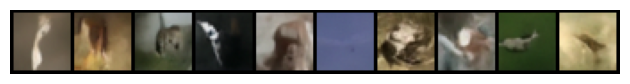

Epoch 91/2000, Loss: 0.0268
Epoch 92/2000, Loss: 0.0361
Epoch 93/2000, Loss: 0.0334
Epoch 94/2000, Loss: 0.0294
Epoch 95/2000, Loss: 0.0315
Epoch 96/2000, Loss: 0.0267
Epoch 97/2000, Loss: 0.0402
Epoch 98/2000, Loss: 0.0421
Epoch 99/2000, Loss: 0.0327
Epoch 100/2000, Loss: 0.0317


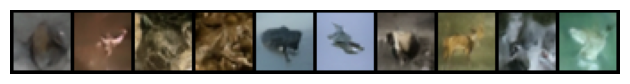

Epoch 101/2000, Loss: 0.0276
Epoch 102/2000, Loss: 0.0328
Epoch 103/2000, Loss: 0.0334
Epoch 104/2000, Loss: 0.0313
Epoch 105/2000, Loss: 0.0317
Epoch 106/2000, Loss: 0.0212
Epoch 107/2000, Loss: 0.0454
Epoch 108/2000, Loss: 0.0217
Epoch 109/2000, Loss: 0.0498
Epoch 110/2000, Loss: 0.0271


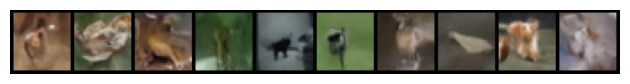

Epoch 111/2000, Loss: 0.0274
Epoch 112/2000, Loss: 0.0392
Epoch 113/2000, Loss: 0.0261
Epoch 114/2000, Loss: 0.0316
Epoch 115/2000, Loss: 0.0229
Epoch 116/2000, Loss: 0.0321
Epoch 117/2000, Loss: 0.0371
Epoch 118/2000, Loss: 0.0234
Epoch 119/2000, Loss: 0.0324
Epoch 120/2000, Loss: 0.0241


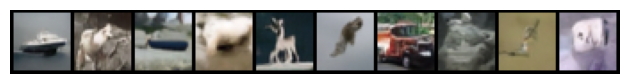

Epoch 121/2000, Loss: 0.0224
Epoch 122/2000, Loss: 0.0320
Epoch 123/2000, Loss: 0.0309
Epoch 124/2000, Loss: 0.0265
Epoch 125/2000, Loss: 0.0282
Epoch 126/2000, Loss: 0.0216
Epoch 127/2000, Loss: 0.0246
Epoch 128/2000, Loss: 0.0282
Epoch 129/2000, Loss: 0.0314
Epoch 130/2000, Loss: 0.0276


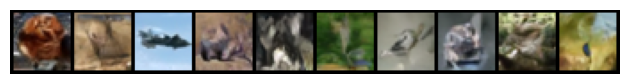

Epoch 131/2000, Loss: 0.0383
Epoch 132/2000, Loss: 0.0176
Epoch 133/2000, Loss: 0.0408
Epoch 134/2000, Loss: 0.0251
Epoch 135/2000, Loss: 0.0389
Epoch 136/2000, Loss: 0.0335
Epoch 137/2000, Loss: 0.0513
Epoch 138/2000, Loss: 0.0247
Epoch 139/2000, Loss: 0.0302
Epoch 140/2000, Loss: 0.0208


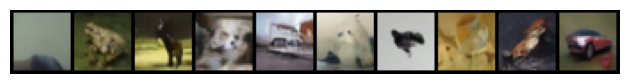

Epoch 141/2000, Loss: 0.0334
Epoch 142/2000, Loss: 0.0245
Epoch 143/2000, Loss: 0.0328
Epoch 144/2000, Loss: 0.0238
Epoch 145/2000, Loss: 0.0255
Epoch 146/2000, Loss: 0.0324
Epoch 147/2000, Loss: 0.0264
Epoch 148/2000, Loss: 0.0310
Epoch 149/2000, Loss: 0.0354
Epoch 150/2000, Loss: 0.0385


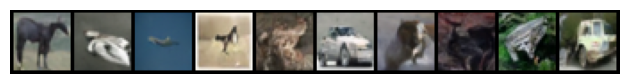

Epoch 151/2000, Loss: 0.0344
Epoch 152/2000, Loss: 0.0285
Epoch 153/2000, Loss: 0.0378
Epoch 154/2000, Loss: 0.0423
Epoch 155/2000, Loss: 0.0194
Epoch 156/2000, Loss: 0.0332
Epoch 157/2000, Loss: 0.0372
Epoch 158/2000, Loss: 0.0468
Epoch 159/2000, Loss: 0.0349
Epoch 160/2000, Loss: 0.0357


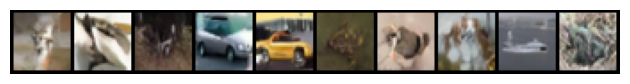

Epoch 161/2000, Loss: 0.0305
Epoch 162/2000, Loss: 0.0223
Epoch 163/2000, Loss: 0.0503
Epoch 164/2000, Loss: 0.0298
Epoch 165/2000, Loss: 0.0280
Epoch 166/2000, Loss: 0.0425
Epoch 167/2000, Loss: 0.0222
Epoch 168/2000, Loss: 0.0279
Epoch 169/2000, Loss: 0.0201
Epoch 170/2000, Loss: 0.0240


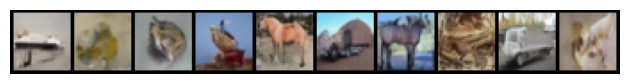

Epoch 171/2000, Loss: 0.0298
Epoch 172/2000, Loss: 0.0404
Epoch 173/2000, Loss: 0.0224
Epoch 174/2000, Loss: 0.0264
Epoch 175/2000, Loss: 0.0263
Epoch 176/2000, Loss: 0.0332
Epoch 177/2000, Loss: 0.0263
Epoch 178/2000, Loss: 0.0252
Epoch 179/2000, Loss: 0.0132
Epoch 180/2000, Loss: 0.0332


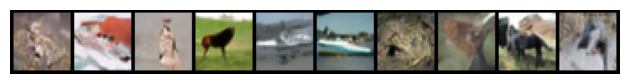

Epoch 181/2000, Loss: 0.0277
Epoch 182/2000, Loss: 0.0341
Epoch 183/2000, Loss: 0.0400
Epoch 184/2000, Loss: 0.0255
Epoch 185/2000, Loss: 0.0447
Epoch 186/2000, Loss: 0.0322
Epoch 187/2000, Loss: 0.0250
Epoch 188/2000, Loss: 0.0363
Epoch 189/2000, Loss: 0.0257
Epoch 190/2000, Loss: 0.0257


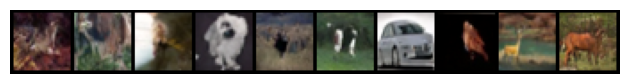

Epoch 191/2000, Loss: 0.0277
Epoch 192/2000, Loss: 0.0225
Epoch 193/2000, Loss: 0.0308
Epoch 194/2000, Loss: 0.0201
Epoch 195/2000, Loss: 0.0319
Epoch 196/2000, Loss: 0.0319
Epoch 197/2000, Loss: 0.0211
Epoch 198/2000, Loss: 0.0196
Epoch 199/2000, Loss: 0.0310
Epoch 200/2000, Loss: 0.0303


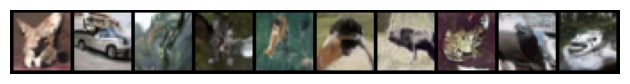

Epoch 201/2000, Loss: 0.0261
Epoch 202/2000, Loss: 0.0337
Epoch 203/2000, Loss: 0.0454
Epoch 204/2000, Loss: 0.0256
Epoch 205/2000, Loss: 0.0224
Epoch 206/2000, Loss: 0.0395
Epoch 207/2000, Loss: 0.0199
Epoch 208/2000, Loss: 0.0298
Epoch 209/2000, Loss: 0.0354
Epoch 210/2000, Loss: 0.0484


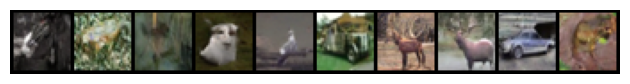

Epoch 211/2000, Loss: 0.0266
Epoch 212/2000, Loss: 0.0348
Epoch 213/2000, Loss: 0.0371
Epoch 214/2000, Loss: 0.0257
Epoch 215/2000, Loss: 0.0324
Epoch 216/2000, Loss: 0.0357
Epoch 217/2000, Loss: 0.0351
Epoch 218/2000, Loss: 0.0223
Epoch 219/2000, Loss: 0.0387
Epoch 220/2000, Loss: 0.0309


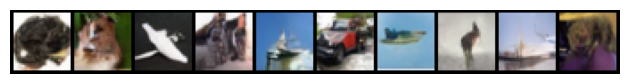

Epoch 221/2000, Loss: 0.0392
Epoch 222/2000, Loss: 0.0293
Epoch 223/2000, Loss: 0.0287
Epoch 224/2000, Loss: 0.0247
Epoch 225/2000, Loss: 0.0217
Epoch 226/2000, Loss: 0.0365
Epoch 227/2000, Loss: 0.0251
Epoch 228/2000, Loss: 0.0326
Epoch 229/2000, Loss: 0.0222
Epoch 230/2000, Loss: 0.0181


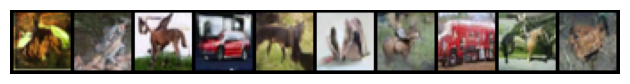

Epoch 231/2000, Loss: 0.0493
Epoch 232/2000, Loss: 0.0250
Epoch 233/2000, Loss: 0.0256
Epoch 234/2000, Loss: 0.0410
Epoch 235/2000, Loss: 0.0353
Epoch 236/2000, Loss: 0.0341
Epoch 237/2000, Loss: 0.0330
Epoch 238/2000, Loss: 0.0239
Epoch 239/2000, Loss: 0.0228
Epoch 240/2000, Loss: 0.0234


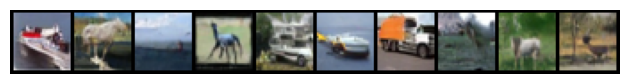

Epoch 241/2000, Loss: 0.0267
Epoch 242/2000, Loss: 0.0333
Epoch 243/2000, Loss: 0.0379
Epoch 244/2000, Loss: 0.0280
Epoch 245/2000, Loss: 0.0303
Epoch 246/2000, Loss: 0.0247
Epoch 247/2000, Loss: 0.0288
Epoch 248/2000, Loss: 0.0219
Epoch 249/2000, Loss: 0.0224
Epoch 250/2000, Loss: 0.0287


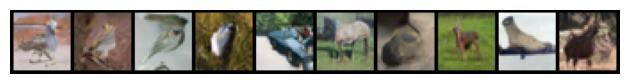

Epoch 251/2000, Loss: 0.0384
Epoch 252/2000, Loss: 0.0314
Epoch 253/2000, Loss: 0.0156
Epoch 254/2000, Loss: 0.0407
Epoch 255/2000, Loss: 0.0219
Epoch 256/2000, Loss: 0.0315
Epoch 257/2000, Loss: 0.0332
Epoch 258/2000, Loss: 0.0288
Epoch 259/2000, Loss: 0.0323
Epoch 260/2000, Loss: 0.0289


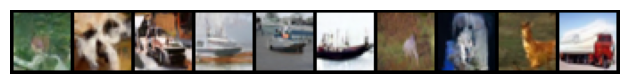

Epoch 261/2000, Loss: 0.0306
Epoch 262/2000, Loss: 0.0331
Epoch 263/2000, Loss: 0.0291
Epoch 264/2000, Loss: 0.0286
Epoch 265/2000, Loss: 0.0199
Epoch 266/2000, Loss: 0.0222
Epoch 267/2000, Loss: 0.0185
Epoch 268/2000, Loss: 0.0311
Epoch 269/2000, Loss: 0.0304
Epoch 270/2000, Loss: 0.0413


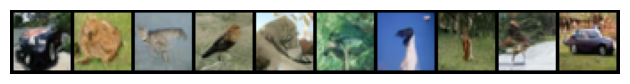

Epoch 271/2000, Loss: 0.0188
Epoch 272/2000, Loss: 0.0179
Epoch 273/2000, Loss: 0.0274
Epoch 274/2000, Loss: 0.0222
Epoch 275/2000, Loss: 0.0392
Epoch 276/2000, Loss: 0.0178
Epoch 277/2000, Loss: 0.0143
Epoch 278/2000, Loss: 0.0364
Epoch 279/2000, Loss: 0.0223
Epoch 280/2000, Loss: 0.0262


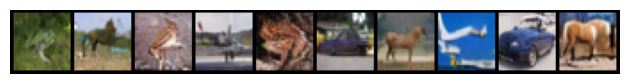

Epoch 281/2000, Loss: 0.0226
Epoch 282/2000, Loss: 0.0329
Epoch 283/2000, Loss: 0.0261
Epoch 284/2000, Loss: 0.0298
Epoch 285/2000, Loss: 0.0273
Epoch 286/2000, Loss: 0.0304
Epoch 287/2000, Loss: 0.0390
Epoch 288/2000, Loss: 0.0310
Epoch 289/2000, Loss: 0.0383
Epoch 290/2000, Loss: 0.0445


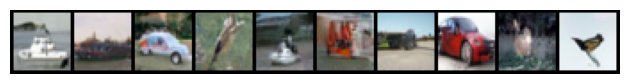

Epoch 291/2000, Loss: 0.0378
Epoch 292/2000, Loss: 0.0280
Epoch 293/2000, Loss: 0.0223
Epoch 294/2000, Loss: 0.0286
Epoch 295/2000, Loss: 0.0253
Epoch 296/2000, Loss: 0.0314
Epoch 297/2000, Loss: 0.0286
Epoch 298/2000, Loss: 0.0214
Epoch 299/2000, Loss: 0.0288
Epoch 300/2000, Loss: 0.0301


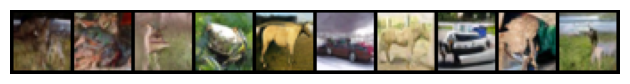

Epoch 301/2000, Loss: 0.0231
Epoch 302/2000, Loss: 0.0218
Epoch 303/2000, Loss: 0.0278
Epoch 304/2000, Loss: 0.0189
Epoch 305/2000, Loss: 0.0226
Epoch 306/2000, Loss: 0.0278
Epoch 307/2000, Loss: 0.0326
Epoch 308/2000, Loss: 0.0454
Epoch 309/2000, Loss: 0.0390
Epoch 310/2000, Loss: 0.0367


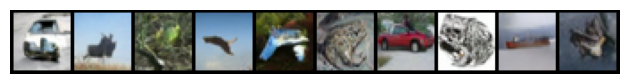

Epoch 311/2000, Loss: 0.0293
Epoch 312/2000, Loss: 0.0209
Epoch 313/2000, Loss: 0.0293
Epoch 314/2000, Loss: 0.0268
Epoch 315/2000, Loss: 0.0288
Epoch 316/2000, Loss: 0.0214
Epoch 317/2000, Loss: 0.0373
Epoch 318/2000, Loss: 0.0270
Epoch 319/2000, Loss: 0.0220
Epoch 320/2000, Loss: 0.0405


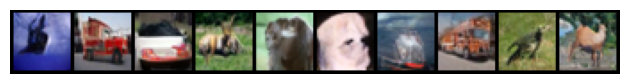

Epoch 321/2000, Loss: 0.0245
Epoch 322/2000, Loss: 0.0319
Epoch 323/2000, Loss: 0.0286
Epoch 324/2000, Loss: 0.0230
Epoch 325/2000, Loss: 0.0285
Epoch 326/2000, Loss: 0.0349
Epoch 327/2000, Loss: 0.0203
Epoch 328/2000, Loss: 0.0417
Epoch 329/2000, Loss: 0.0187
Epoch 330/2000, Loss: 0.0345


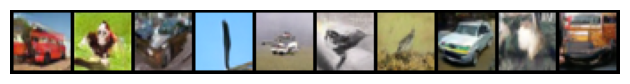

Epoch 331/2000, Loss: 0.0304
Epoch 332/2000, Loss: 0.0251
Epoch 333/2000, Loss: 0.0162
Epoch 334/2000, Loss: 0.0336
Epoch 335/2000, Loss: 0.0306
Epoch 336/2000, Loss: 0.0272
Epoch 337/2000, Loss: 0.0297
Epoch 338/2000, Loss: 0.0285
Epoch 339/2000, Loss: 0.0339
Epoch 340/2000, Loss: 0.0243


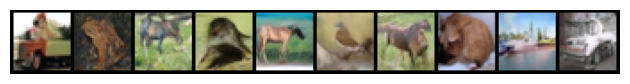

Epoch 341/2000, Loss: 0.0289
Epoch 342/2000, Loss: 0.0347
Epoch 343/2000, Loss: 0.0245
Epoch 344/2000, Loss: 0.0445
Epoch 345/2000, Loss: 0.0352
Epoch 346/2000, Loss: 0.0310
Epoch 347/2000, Loss: 0.0320
Epoch 348/2000, Loss: 0.0207
Epoch 349/2000, Loss: 0.0217
Epoch 350/2000, Loss: 0.0236


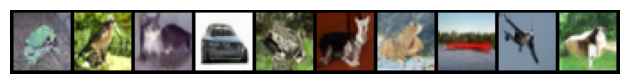

Epoch 351/2000, Loss: 0.0326
Epoch 352/2000, Loss: 0.0313
Epoch 353/2000, Loss: 0.0241
Epoch 354/2000, Loss: 0.0287
Epoch 355/2000, Loss: 0.0309
Epoch 356/2000, Loss: 0.0474
Epoch 357/2000, Loss: 0.0214
Epoch 358/2000, Loss: 0.0290
Epoch 359/2000, Loss: 0.0288
Epoch 360/2000, Loss: 0.0415


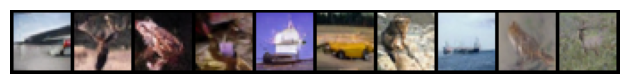

Epoch 361/2000, Loss: 0.0388
Epoch 362/2000, Loss: 0.0393
Epoch 363/2000, Loss: 0.0310
Epoch 364/2000, Loss: 0.0279
Epoch 365/2000, Loss: 0.0249
Epoch 366/2000, Loss: 0.0200
Epoch 367/2000, Loss: 0.0327
Epoch 368/2000, Loss: 0.0327
Epoch 369/2000, Loss: 0.0254
Epoch 370/2000, Loss: 0.0260


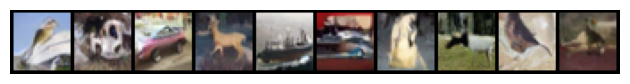

Epoch 371/2000, Loss: 0.0221
Epoch 372/2000, Loss: 0.0291
Epoch 373/2000, Loss: 0.0208
Epoch 374/2000, Loss: 0.0219
Epoch 375/2000, Loss: 0.0233
Epoch 376/2000, Loss: 0.0297
Epoch 377/2000, Loss: 0.0297
Epoch 378/2000, Loss: 0.0329
Epoch 379/2000, Loss: 0.0277
Epoch 380/2000, Loss: 0.0400


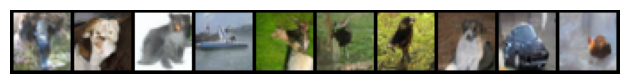

Epoch 381/2000, Loss: 0.0285
Epoch 382/2000, Loss: 0.0310
Epoch 383/2000, Loss: 0.0243
Epoch 384/2000, Loss: 0.0277
Epoch 385/2000, Loss: 0.0398
Epoch 386/2000, Loss: 0.0375
Epoch 387/2000, Loss: 0.0285
Epoch 388/2000, Loss: 0.0286
Epoch 389/2000, Loss: 0.0277
Epoch 390/2000, Loss: 0.0272


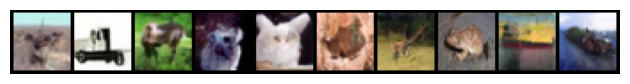

Epoch 391/2000, Loss: 0.0343
Epoch 392/2000, Loss: 0.0236
Epoch 393/2000, Loss: 0.0265
Epoch 394/2000, Loss: 0.0229
Epoch 395/2000, Loss: 0.0411
Epoch 396/2000, Loss: 0.0345
Epoch 397/2000, Loss: 0.0257
Epoch 398/2000, Loss: 0.0191
Epoch 399/2000, Loss: 0.0339
Epoch 400/2000, Loss: 0.0179


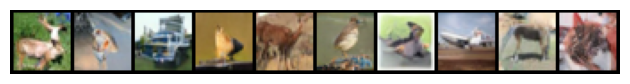

Epoch 401/2000, Loss: 0.0142
Epoch 402/2000, Loss: 0.0284
Epoch 403/2000, Loss: 0.0280
Epoch 404/2000, Loss: 0.0255
Epoch 405/2000, Loss: 0.0394
Epoch 406/2000, Loss: 0.0334
Epoch 407/2000, Loss: 0.0540
Epoch 408/2000, Loss: 0.0326
Epoch 409/2000, Loss: 0.0226
Epoch 410/2000, Loss: 0.0189


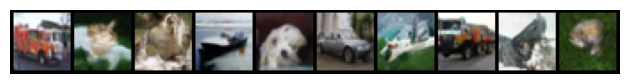

Epoch 411/2000, Loss: 0.0359
Epoch 412/2000, Loss: 0.0357
Epoch 413/2000, Loss: 0.0348
Epoch 414/2000, Loss: 0.0261
Epoch 415/2000, Loss: 0.0296
Epoch 416/2000, Loss: 0.0229
Epoch 417/2000, Loss: 0.0187
Epoch 418/2000, Loss: 0.0301
Epoch 419/2000, Loss: 0.0283
Epoch 420/2000, Loss: 0.0171


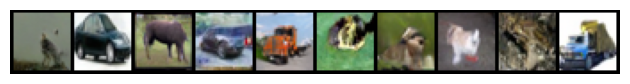

Epoch 421/2000, Loss: 0.0359
Epoch 422/2000, Loss: 0.0210
Epoch 423/2000, Loss: 0.0399
Epoch 424/2000, Loss: 0.0244
Epoch 425/2000, Loss: 0.0221
Epoch 426/2000, Loss: 0.0334
Epoch 427/2000, Loss: 0.0228
Epoch 428/2000, Loss: 0.0249
Epoch 429/2000, Loss: 0.0432
Epoch 430/2000, Loss: 0.0331


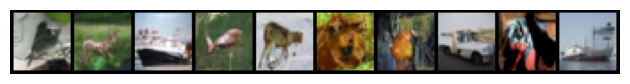

Epoch 431/2000, Loss: 0.0360
Epoch 432/2000, Loss: 0.0396
Epoch 433/2000, Loss: 0.0381
Epoch 434/2000, Loss: 0.0359
Epoch 435/2000, Loss: 0.0198
Epoch 436/2000, Loss: 0.0249
Epoch 437/2000, Loss: 0.0326
Epoch 438/2000, Loss: 0.0263
Epoch 439/2000, Loss: 0.0292
Epoch 440/2000, Loss: 0.0357


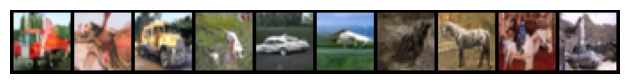

Epoch 441/2000, Loss: 0.0268
Epoch 442/2000, Loss: 0.0374
Epoch 443/2000, Loss: 0.0340
Epoch 444/2000, Loss: 0.0426
Epoch 445/2000, Loss: 0.0336
Epoch 446/2000, Loss: 0.0224
Epoch 447/2000, Loss: 0.0289
Epoch 448/2000, Loss: 0.0258
Epoch 449/2000, Loss: 0.0308
Epoch 450/2000, Loss: 0.0384


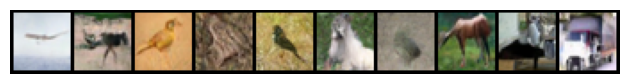

Epoch 451/2000, Loss: 0.0224
Epoch 452/2000, Loss: 0.0310
Epoch 453/2000, Loss: 0.0219
Epoch 454/2000, Loss: 0.0364
Epoch 455/2000, Loss: 0.0225
Epoch 456/2000, Loss: 0.0202
Epoch 457/2000, Loss: 0.0381
Epoch 458/2000, Loss: 0.0245
Epoch 459/2000, Loss: 0.0165
Epoch 460/2000, Loss: 0.0439


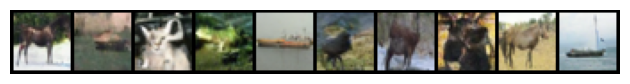

Epoch 461/2000, Loss: 0.0262
Epoch 462/2000, Loss: 0.0190
Epoch 463/2000, Loss: 0.0378
Epoch 464/2000, Loss: 0.0246
Epoch 465/2000, Loss: 0.0351
Epoch 466/2000, Loss: 0.0196
Epoch 467/2000, Loss: 0.0321
Epoch 468/2000, Loss: 0.0281
Epoch 469/2000, Loss: 0.0257
Epoch 470/2000, Loss: 0.0301


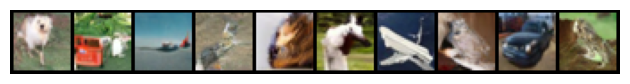

Epoch 471/2000, Loss: 0.0253
Epoch 472/2000, Loss: 0.0185
Epoch 473/2000, Loss: 0.0258
Epoch 474/2000, Loss: 0.0312
Epoch 475/2000, Loss: 0.0362
Epoch 476/2000, Loss: 0.0314
Epoch 477/2000, Loss: 0.0267
Epoch 478/2000, Loss: 0.0240
Epoch 479/2000, Loss: 0.0385
Epoch 480/2000, Loss: 0.0181


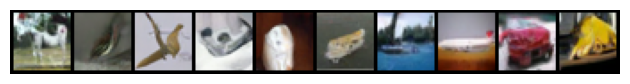

Epoch 481/2000, Loss: 0.0322
Epoch 482/2000, Loss: 0.0302
Epoch 483/2000, Loss: 0.0376
Epoch 484/2000, Loss: 0.0350
Epoch 485/2000, Loss: 0.0264
Epoch 486/2000, Loss: 0.0213
Epoch 487/2000, Loss: 0.0372
Epoch 488/2000, Loss: 0.0205
Epoch 489/2000, Loss: 0.0333
Epoch 490/2000, Loss: 0.0329


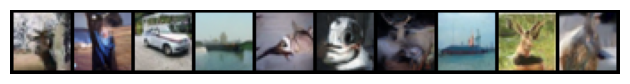

Epoch 491/2000, Loss: 0.0306
Epoch 492/2000, Loss: 0.0382
Epoch 493/2000, Loss: 0.0224
Epoch 494/2000, Loss: 0.0209
Epoch 495/2000, Loss: 0.0223
Epoch 496/2000, Loss: 0.0409
Epoch 497/2000, Loss: 0.0371
Epoch 498/2000, Loss: 0.0411
Epoch 499/2000, Loss: 0.0297
Epoch 500/2000, Loss: 0.0252


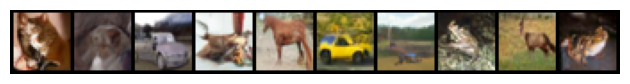

Epoch 501/2000, Loss: 0.0323
Epoch 502/2000, Loss: 0.0283
Epoch 503/2000, Loss: 0.0404
Epoch 504/2000, Loss: 0.0192
Epoch 505/2000, Loss: 0.0266
Epoch 506/2000, Loss: 0.0313
Epoch 507/2000, Loss: 0.0248
Epoch 508/2000, Loss: 0.0272
Epoch 509/2000, Loss: 0.0338
Epoch 510/2000, Loss: 0.0360


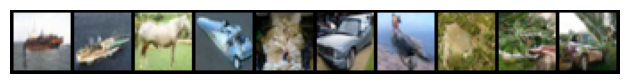

Epoch 511/2000, Loss: 0.0354
Epoch 512/2000, Loss: 0.0288
Epoch 513/2000, Loss: 0.0258
Epoch 514/2000, Loss: 0.0213
Epoch 515/2000, Loss: 0.0310
Epoch 516/2000, Loss: 0.0245
Epoch 517/2000, Loss: 0.0258
Epoch 518/2000, Loss: 0.0324
Epoch 519/2000, Loss: 0.0182
Epoch 520/2000, Loss: 0.0293


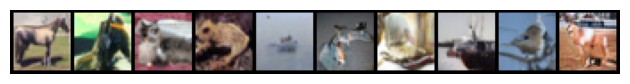

Epoch 521/2000, Loss: 0.0245
Epoch 522/2000, Loss: 0.0204
Epoch 523/2000, Loss: 0.0290
Epoch 524/2000, Loss: 0.0399
Epoch 525/2000, Loss: 0.0391
Epoch 526/2000, Loss: 0.0242
Epoch 527/2000, Loss: 0.0255
Epoch 528/2000, Loss: 0.0233
Epoch 529/2000, Loss: 0.0222
Epoch 530/2000, Loss: 0.0144


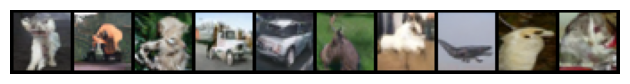

Epoch 531/2000, Loss: 0.0322
Epoch 532/2000, Loss: 0.0278
Epoch 533/2000, Loss: 0.0389
Epoch 534/2000, Loss: 0.0435
Epoch 535/2000, Loss: 0.0256
Epoch 536/2000, Loss: 0.0304
Epoch 537/2000, Loss: 0.0219
Epoch 538/2000, Loss: 0.0301
Epoch 539/2000, Loss: 0.0327
Epoch 540/2000, Loss: 0.0357


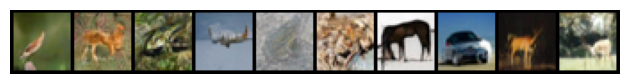

Epoch 541/2000, Loss: 0.0252
Epoch 542/2000, Loss: 0.0256
Epoch 543/2000, Loss: 0.0190
Epoch 544/2000, Loss: 0.0309
Epoch 545/2000, Loss: 0.0306
Epoch 546/2000, Loss: 0.0352
Epoch 547/2000, Loss: 0.0190
Epoch 548/2000, Loss: 0.0321
Epoch 549/2000, Loss: 0.0198
Epoch 550/2000, Loss: 0.0225


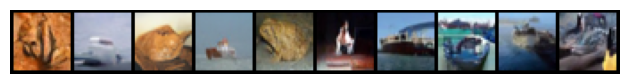

Epoch 551/2000, Loss: 0.0415
Epoch 552/2000, Loss: 0.0204
Epoch 553/2000, Loss: 0.0369
Epoch 554/2000, Loss: 0.0243
Epoch 555/2000, Loss: 0.0294
Epoch 556/2000, Loss: 0.0216
Epoch 557/2000, Loss: 0.0368
Epoch 558/2000, Loss: 0.0381
Epoch 559/2000, Loss: 0.0379
Epoch 560/2000, Loss: 0.0309


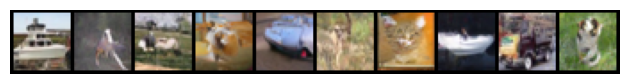

Epoch 561/2000, Loss: 0.0315
Epoch 562/2000, Loss: 0.0308
Epoch 563/2000, Loss: 0.0311
Epoch 564/2000, Loss: 0.0356
Epoch 565/2000, Loss: 0.0238
Epoch 566/2000, Loss: 0.0249
Epoch 567/2000, Loss: 0.0377
Epoch 568/2000, Loss: 0.0249
Epoch 569/2000, Loss: 0.0369
Epoch 570/2000, Loss: 0.0219


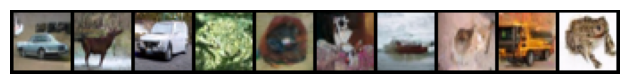

Epoch 571/2000, Loss: 0.0323
Epoch 572/2000, Loss: 0.0283
Epoch 573/2000, Loss: 0.0317
Epoch 574/2000, Loss: 0.0323
Epoch 575/2000, Loss: 0.0421
Epoch 576/2000, Loss: 0.0326
Epoch 577/2000, Loss: 0.0270
Epoch 578/2000, Loss: 0.0299
Epoch 579/2000, Loss: 0.0327
Epoch 580/2000, Loss: 0.0317


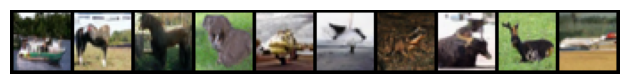

Epoch 581/2000, Loss: 0.0227
Epoch 582/2000, Loss: 0.0202
Epoch 583/2000, Loss: 0.0317
Epoch 584/2000, Loss: 0.0311
Epoch 585/2000, Loss: 0.0231
Epoch 586/2000, Loss: 0.0412
Epoch 587/2000, Loss: 0.0257
Epoch 588/2000, Loss: 0.0293
Epoch 589/2000, Loss: 0.0210
Epoch 590/2000, Loss: 0.0303


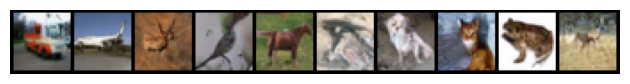

Epoch 591/2000, Loss: 0.0321
Epoch 592/2000, Loss: 0.0250
Epoch 593/2000, Loss: 0.0251
Epoch 594/2000, Loss: 0.0242
Epoch 595/2000, Loss: 0.0401
Epoch 596/2000, Loss: 0.0279
Epoch 597/2000, Loss: 0.0357
Epoch 598/2000, Loss: 0.0298
Epoch 599/2000, Loss: 0.0199
Epoch 600/2000, Loss: 0.0289


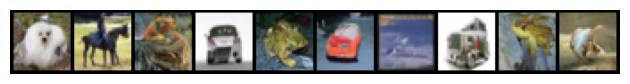

Epoch 601/2000, Loss: 0.0266
Epoch 602/2000, Loss: 0.0261
Epoch 603/2000, Loss: 0.0227
Epoch 604/2000, Loss: 0.0248
Epoch 605/2000, Loss: 0.0265
Epoch 606/2000, Loss: 0.0271
Epoch 607/2000, Loss: 0.0342
Epoch 608/2000, Loss: 0.0320
Epoch 609/2000, Loss: 0.0354
Epoch 610/2000, Loss: 0.0240


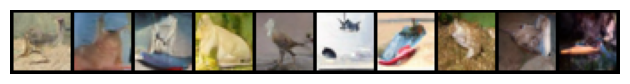

Epoch 611/2000, Loss: 0.0327
Epoch 612/2000, Loss: 0.0276
Epoch 613/2000, Loss: 0.0329
Epoch 614/2000, Loss: 0.0255
Epoch 615/2000, Loss: 0.0316
Epoch 616/2000, Loss: 0.0324
Epoch 617/2000, Loss: 0.0310
Epoch 618/2000, Loss: 0.0189
Epoch 619/2000, Loss: 0.0257
Epoch 620/2000, Loss: 0.0312


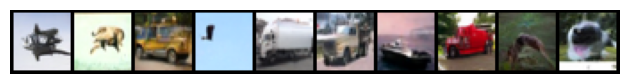

Epoch 621/2000, Loss: 0.0299
Epoch 622/2000, Loss: 0.0230
Epoch 623/2000, Loss: 0.0278
Epoch 624/2000, Loss: 0.0245
Epoch 625/2000, Loss: 0.0429
Epoch 626/2000, Loss: 0.0263
Epoch 627/2000, Loss: 0.0280
Epoch 628/2000, Loss: 0.0254
Epoch 629/2000, Loss: 0.0309
Epoch 630/2000, Loss: 0.0182


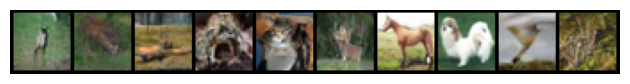

Epoch 631/2000, Loss: 0.0339
Epoch 632/2000, Loss: 0.0209
Epoch 633/2000, Loss: 0.0234
Epoch 634/2000, Loss: 0.0244
Epoch 635/2000, Loss: 0.0204
Epoch 636/2000, Loss: 0.0347
Epoch 637/2000, Loss: 0.0252
Epoch 638/2000, Loss: 0.0226
Epoch 639/2000, Loss: 0.0299
Epoch 640/2000, Loss: 0.0369


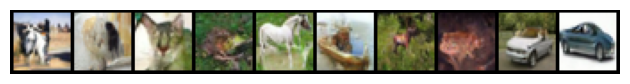

Epoch 641/2000, Loss: 0.0326
Epoch 642/2000, Loss: 0.0185
Epoch 643/2000, Loss: 0.0279
Epoch 644/2000, Loss: 0.0217
Epoch 645/2000, Loss: 0.0178
Epoch 646/2000, Loss: 0.0399
Epoch 647/2000, Loss: 0.0303
Epoch 648/2000, Loss: 0.0348
Epoch 649/2000, Loss: 0.0299
Epoch 650/2000, Loss: 0.0358


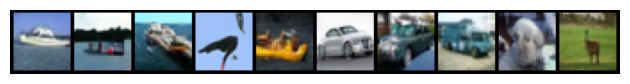

Epoch 651/2000, Loss: 0.0389
Epoch 652/2000, Loss: 0.0236
Epoch 653/2000, Loss: 0.0480
Epoch 654/2000, Loss: 0.0196
Epoch 655/2000, Loss: 0.0320
Epoch 656/2000, Loss: 0.0252
Epoch 657/2000, Loss: 0.0209
Epoch 658/2000, Loss: 0.0322
Epoch 659/2000, Loss: 0.0293
Epoch 660/2000, Loss: 0.0257


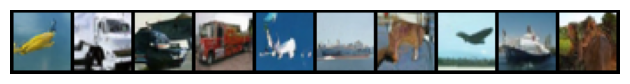

Epoch 661/2000, Loss: 0.0289
Epoch 662/2000, Loss: 0.0192
Epoch 663/2000, Loss: 0.0206
Epoch 664/2000, Loss: 0.0252
Epoch 665/2000, Loss: 0.0232
Epoch 666/2000, Loss: 0.0333
Epoch 667/2000, Loss: 0.0345
Epoch 668/2000, Loss: 0.0234
Epoch 669/2000, Loss: 0.0328
Epoch 670/2000, Loss: 0.0318


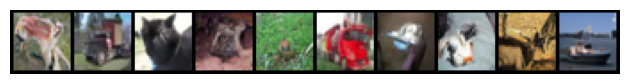

Epoch 671/2000, Loss: 0.0327
Epoch 672/2000, Loss: 0.0248
Epoch 673/2000, Loss: 0.0344
Epoch 674/2000, Loss: 0.0348
Epoch 675/2000, Loss: 0.0330
Epoch 676/2000, Loss: 0.0378
Epoch 677/2000, Loss: 0.0404
Epoch 678/2000, Loss: 0.0239
Epoch 679/2000, Loss: 0.0259
Epoch 680/2000, Loss: 0.0390


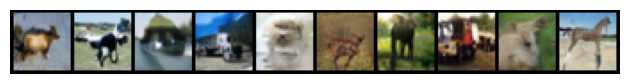

Epoch 681/2000, Loss: 0.0305
Epoch 682/2000, Loss: 0.0261
Epoch 683/2000, Loss: 0.0206
Epoch 684/2000, Loss: 0.0262
Epoch 685/2000, Loss: 0.0225
Epoch 686/2000, Loss: 0.0338
Epoch 687/2000, Loss: 0.0263
Epoch 688/2000, Loss: 0.0203
Epoch 689/2000, Loss: 0.0228
Epoch 690/2000, Loss: 0.0269


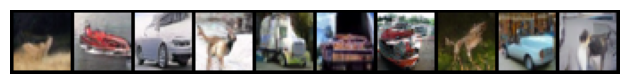

Epoch 691/2000, Loss: 0.0232
Epoch 692/2000, Loss: 0.0436
Epoch 693/2000, Loss: 0.0330
Epoch 694/2000, Loss: 0.0197
Epoch 695/2000, Loss: 0.0279
Epoch 696/2000, Loss: 0.0366
Epoch 697/2000, Loss: 0.0345
Epoch 698/2000, Loss: 0.0243
Epoch 699/2000, Loss: 0.0282
Epoch 700/2000, Loss: 0.0187


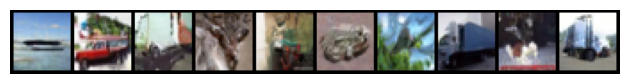

Epoch 701/2000, Loss: 0.0255
Epoch 702/2000, Loss: 0.0285
Epoch 703/2000, Loss: 0.0344
Epoch 704/2000, Loss: 0.0350
Epoch 705/2000, Loss: 0.0259
Epoch 706/2000, Loss: 0.0251
Epoch 707/2000, Loss: 0.0252
Epoch 708/2000, Loss: 0.0220
Epoch 709/2000, Loss: 0.0281
Epoch 710/2000, Loss: 0.0253


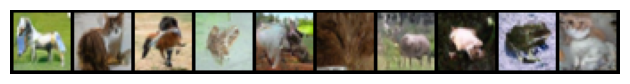

Epoch 711/2000, Loss: 0.0208
Epoch 712/2000, Loss: 0.0294
Epoch 713/2000, Loss: 0.0271
Epoch 714/2000, Loss: 0.0263
Epoch 715/2000, Loss: 0.0195
Epoch 716/2000, Loss: 0.0292
Epoch 717/2000, Loss: 0.0271
Epoch 718/2000, Loss: 0.0285
Epoch 719/2000, Loss: 0.0198
Epoch 720/2000, Loss: 0.0225


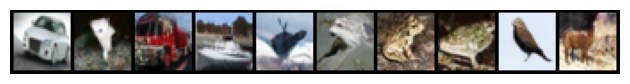

Epoch 721/2000, Loss: 0.0198
Epoch 722/2000, Loss: 0.0353
Epoch 723/2000, Loss: 0.0243
Epoch 724/2000, Loss: 0.0294
Epoch 725/2000, Loss: 0.0319
Epoch 726/2000, Loss: 0.0561
Epoch 727/2000, Loss: 0.0258
Epoch 728/2000, Loss: 0.0284
Epoch 729/2000, Loss: 0.0281
Epoch 730/2000, Loss: 0.0315


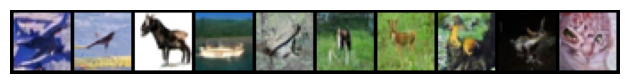

Epoch 731/2000, Loss: 0.0241
Epoch 732/2000, Loss: 0.0300
Epoch 733/2000, Loss: 0.0297
Epoch 734/2000, Loss: 0.0335
Epoch 735/2000, Loss: 0.0239
Epoch 736/2000, Loss: 0.0211
Epoch 737/2000, Loss: 0.0193
Epoch 738/2000, Loss: 0.0284
Epoch 739/2000, Loss: 0.0269
Epoch 740/2000, Loss: 0.0265


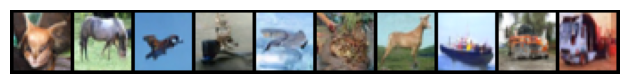

Epoch 741/2000, Loss: 0.0267
Epoch 742/2000, Loss: 0.0292
Epoch 743/2000, Loss: 0.0243
Epoch 744/2000, Loss: 0.0296
Epoch 745/2000, Loss: 0.0252
Epoch 746/2000, Loss: 0.0332
Epoch 747/2000, Loss: 0.0347
Epoch 748/2000, Loss: 0.0278
Epoch 749/2000, Loss: 0.0362
Epoch 750/2000, Loss: 0.0248


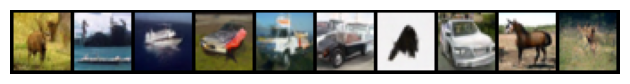

Epoch 751/2000, Loss: 0.0350
Epoch 752/2000, Loss: 0.0223
Epoch 753/2000, Loss: 0.0361
Epoch 754/2000, Loss: 0.0219
Epoch 755/2000, Loss: 0.0263
Epoch 756/2000, Loss: 0.0343
Epoch 757/2000, Loss: 0.0274
Epoch 758/2000, Loss: 0.0184
Epoch 759/2000, Loss: 0.0300
Epoch 760/2000, Loss: 0.0350


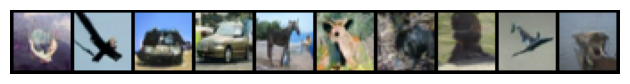

Epoch 761/2000, Loss: 0.0293
Epoch 762/2000, Loss: 0.0300
Epoch 763/2000, Loss: 0.0305
Epoch 764/2000, Loss: 0.0287
Epoch 765/2000, Loss: 0.0346
Epoch 766/2000, Loss: 0.0183
Epoch 767/2000, Loss: 0.0290
Epoch 768/2000, Loss: 0.0388
Epoch 769/2000, Loss: 0.0326
Epoch 770/2000, Loss: 0.0189


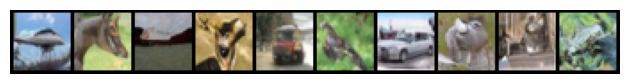

Epoch 771/2000, Loss: 0.0283
Epoch 772/2000, Loss: 0.0278
Epoch 773/2000, Loss: 0.0292
Epoch 774/2000, Loss: 0.0278
Epoch 775/2000, Loss: 0.0252
Epoch 776/2000, Loss: 0.0228
Epoch 777/2000, Loss: 0.0263
Epoch 778/2000, Loss: 0.0267
Epoch 779/2000, Loss: 0.0315
Epoch 780/2000, Loss: 0.0235


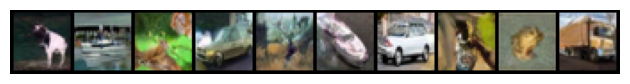

Epoch 781/2000, Loss: 0.0345
Epoch 782/2000, Loss: 0.0210
Epoch 783/2000, Loss: 0.0399
Epoch 784/2000, Loss: 0.0292
Epoch 785/2000, Loss: 0.0324
Epoch 786/2000, Loss: 0.0289
Epoch 787/2000, Loss: 0.0265
Epoch 788/2000, Loss: 0.0261
Epoch 789/2000, Loss: 0.0365
Epoch 790/2000, Loss: 0.0277


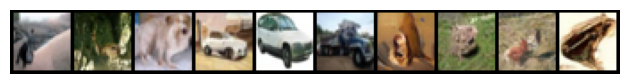

Epoch 791/2000, Loss: 0.0282
Epoch 792/2000, Loss: 0.0272
Epoch 793/2000, Loss: 0.0235
Epoch 794/2000, Loss: 0.0273
Epoch 795/2000, Loss: 0.0217
Epoch 796/2000, Loss: 0.0395
Epoch 797/2000, Loss: 0.0383
Epoch 798/2000, Loss: 0.0252
Epoch 799/2000, Loss: 0.0304
Epoch 800/2000, Loss: 0.0248


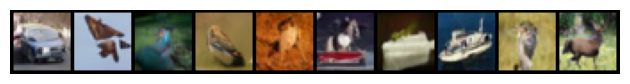

Epoch 801/2000, Loss: 0.0226
Epoch 802/2000, Loss: 0.0232
Epoch 803/2000, Loss: 0.0297
Epoch 804/2000, Loss: 0.0497
Epoch 805/2000, Loss: 0.0239
Epoch 806/2000, Loss: 0.0210
Epoch 807/2000, Loss: 0.0258
Epoch 808/2000, Loss: 0.0310
Epoch 809/2000, Loss: 0.0265
Epoch 810/2000, Loss: 0.0337


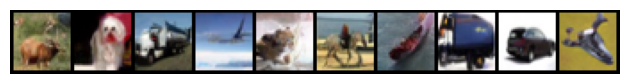

Epoch 811/2000, Loss: 0.0383
Epoch 812/2000, Loss: 0.0243
Epoch 813/2000, Loss: 0.0213
Epoch 814/2000, Loss: 0.0320
Epoch 815/2000, Loss: 0.0272
Epoch 816/2000, Loss: 0.0364
Epoch 817/2000, Loss: 0.0269
Epoch 818/2000, Loss: 0.0272
Epoch 819/2000, Loss: 0.0250
Epoch 820/2000, Loss: 0.0321


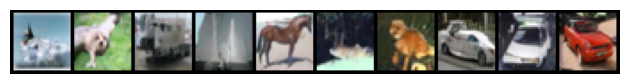

Epoch 821/2000, Loss: 0.0287
Epoch 822/2000, Loss: 0.0271
Epoch 823/2000, Loss: 0.0395
Epoch 824/2000, Loss: 0.0178
Epoch 825/2000, Loss: 0.0319
Epoch 826/2000, Loss: 0.0298
Epoch 827/2000, Loss: 0.0275
Epoch 828/2000, Loss: 0.0286
Epoch 829/2000, Loss: 0.0203
Epoch 830/2000, Loss: 0.0194


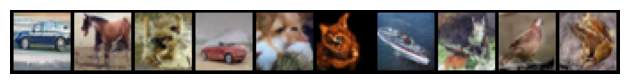

Epoch 831/2000, Loss: 0.0190
Epoch 832/2000, Loss: 0.0411
Epoch 833/2000, Loss: 0.0240
Epoch 834/2000, Loss: 0.0192
Epoch 835/2000, Loss: 0.0255
Epoch 836/2000, Loss: 0.0372
Epoch 837/2000, Loss: 0.0306
Epoch 838/2000, Loss: 0.0328
Epoch 839/2000, Loss: 0.0269
Epoch 840/2000, Loss: 0.0281


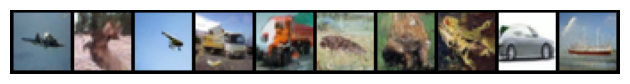

Epoch 841/2000, Loss: 0.0274
Epoch 842/2000, Loss: 0.0241
Epoch 843/2000, Loss: 0.0224
Epoch 844/2000, Loss: 0.0293
Epoch 845/2000, Loss: 0.0228
Epoch 846/2000, Loss: 0.0336
Epoch 847/2000, Loss: 0.0247
Epoch 848/2000, Loss: 0.0306
Epoch 849/2000, Loss: 0.0186
Epoch 850/2000, Loss: 0.0180


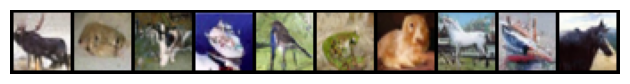

Epoch 851/2000, Loss: 0.0147
Epoch 852/2000, Loss: 0.0312
Epoch 853/2000, Loss: 0.0231
Epoch 854/2000, Loss: 0.0174
Epoch 855/2000, Loss: 0.0267
Epoch 856/2000, Loss: 0.0249
Epoch 857/2000, Loss: 0.0336
Epoch 858/2000, Loss: 0.0222
Epoch 859/2000, Loss: 0.0306
Epoch 860/2000, Loss: 0.0286


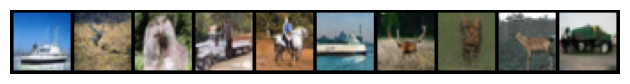

Epoch 861/2000, Loss: 0.0250
Epoch 862/2000, Loss: 0.0344
Epoch 863/2000, Loss: 0.0374
Epoch 864/2000, Loss: 0.0200
Epoch 865/2000, Loss: 0.0314
Epoch 866/2000, Loss: 0.0358
Epoch 867/2000, Loss: 0.0327
Epoch 868/2000, Loss: 0.0301
Epoch 869/2000, Loss: 0.0371
Epoch 870/2000, Loss: 0.0158


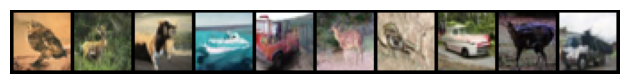

Epoch 871/2000, Loss: 0.0211
Epoch 872/2000, Loss: 0.0331
Epoch 873/2000, Loss: 0.0303
Epoch 874/2000, Loss: 0.0171
Epoch 875/2000, Loss: 0.0223
Epoch 876/2000, Loss: 0.0200
Epoch 877/2000, Loss: 0.0382
Epoch 878/2000, Loss: 0.0344
Epoch 879/2000, Loss: 0.0168
Epoch 880/2000, Loss: 0.0235


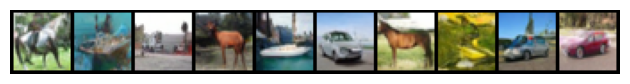

Epoch 881/2000, Loss: 0.0307
Epoch 882/2000, Loss: 0.0309
Epoch 883/2000, Loss: 0.0244
Epoch 884/2000, Loss: 0.0235
Epoch 885/2000, Loss: 0.0285
Epoch 886/2000, Loss: 0.0316
Epoch 887/2000, Loss: 0.0326
Epoch 888/2000, Loss: 0.0163
Epoch 889/2000, Loss: 0.0363
Epoch 890/2000, Loss: 0.0144


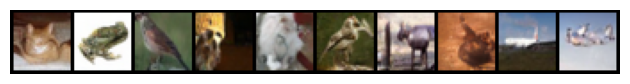

Epoch 891/2000, Loss: 0.0301
Epoch 892/2000, Loss: 0.0383
Epoch 893/2000, Loss: 0.0188
Epoch 894/2000, Loss: 0.0364
Epoch 895/2000, Loss: 0.0364
Epoch 896/2000, Loss: 0.0284
Epoch 897/2000, Loss: 0.0342
Epoch 898/2000, Loss: 0.0370
Epoch 899/2000, Loss: 0.0268
Epoch 900/2000, Loss: 0.0270


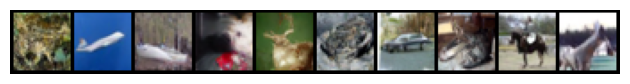

Epoch 901/2000, Loss: 0.0224
Epoch 902/2000, Loss: 0.0396
Epoch 903/2000, Loss: 0.0223
Epoch 904/2000, Loss: 0.0207
Epoch 905/2000, Loss: 0.0177
Epoch 906/2000, Loss: 0.0312
Epoch 907/2000, Loss: 0.0338
Epoch 908/2000, Loss: 0.0300
Epoch 909/2000, Loss: 0.0174
Epoch 910/2000, Loss: 0.0326


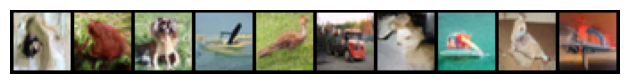

Epoch 911/2000, Loss: 0.0259
Epoch 912/2000, Loss: 0.0270
Epoch 913/2000, Loss: 0.0484
Epoch 914/2000, Loss: 0.0383
Epoch 915/2000, Loss: 0.0400
Epoch 916/2000, Loss: 0.0231
Epoch 917/2000, Loss: 0.0250
Epoch 918/2000, Loss: 0.0285
Epoch 919/2000, Loss: 0.0307
Epoch 920/2000, Loss: 0.0207


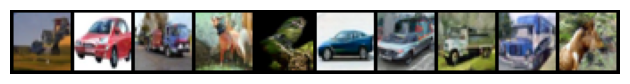

Epoch 921/2000, Loss: 0.0258
Epoch 922/2000, Loss: 0.0292
Epoch 923/2000, Loss: 0.0311
Epoch 924/2000, Loss: 0.0212
Epoch 925/2000, Loss: 0.0448
Epoch 926/2000, Loss: 0.0238
Epoch 927/2000, Loss: 0.0317
Epoch 928/2000, Loss: 0.0185
Epoch 929/2000, Loss: 0.0199
Epoch 930/2000, Loss: 0.0289


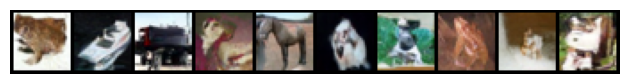

Epoch 931/2000, Loss: 0.0196
Epoch 932/2000, Loss: 0.0347
Epoch 933/2000, Loss: 0.0413
Epoch 934/2000, Loss: 0.0227
Epoch 935/2000, Loss: 0.0324
Epoch 936/2000, Loss: 0.0207
Epoch 937/2000, Loss: 0.0340
Epoch 938/2000, Loss: 0.0279
Epoch 939/2000, Loss: 0.0274
Epoch 940/2000, Loss: 0.0254


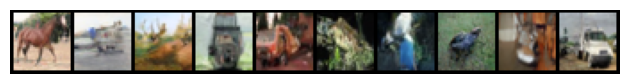

Epoch 941/2000, Loss: 0.0269
Epoch 942/2000, Loss: 0.0202
Epoch 943/2000, Loss: 0.0288
Epoch 944/2000, Loss: 0.0221
Epoch 945/2000, Loss: 0.0249
Epoch 946/2000, Loss: 0.0171
Epoch 947/2000, Loss: 0.0268
Epoch 948/2000, Loss: 0.0363
Epoch 949/2000, Loss: 0.0162
Epoch 950/2000, Loss: 0.0211


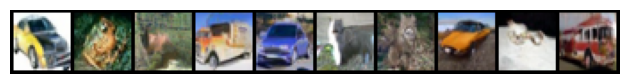

Epoch 951/2000, Loss: 0.0213
Epoch 952/2000, Loss: 0.0255
Epoch 953/2000, Loss: 0.0235
Epoch 954/2000, Loss: 0.0291
Epoch 955/2000, Loss: 0.0318
Epoch 956/2000, Loss: 0.0385
Epoch 957/2000, Loss: 0.0267
Epoch 958/2000, Loss: 0.0290
Epoch 959/2000, Loss: 0.0368
Epoch 960/2000, Loss: 0.0294


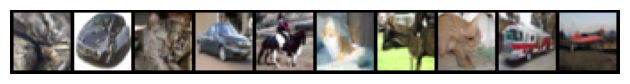

Epoch 961/2000, Loss: 0.0203
Epoch 962/2000, Loss: 0.0284
Epoch 963/2000, Loss: 0.0266
Epoch 964/2000, Loss: 0.0290
Epoch 965/2000, Loss: 0.0288
Epoch 966/2000, Loss: 0.0202
Epoch 967/2000, Loss: 0.0322
Epoch 968/2000, Loss: 0.0300
Epoch 969/2000, Loss: 0.0380
Epoch 970/2000, Loss: 0.0214


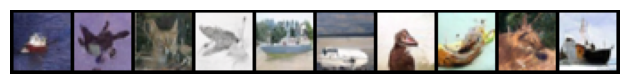

Epoch 971/2000, Loss: 0.0202
Epoch 972/2000, Loss: 0.0273
Epoch 973/2000, Loss: 0.0323
Epoch 974/2000, Loss: 0.0338
Epoch 975/2000, Loss: 0.0182
Epoch 976/2000, Loss: 0.0403
Epoch 977/2000, Loss: 0.0300
Epoch 978/2000, Loss: 0.0407
Epoch 979/2000, Loss: 0.0304
Epoch 980/2000, Loss: 0.0186


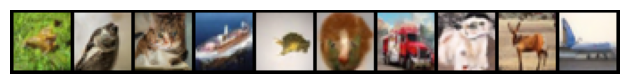

Epoch 981/2000, Loss: 0.0314
Epoch 982/2000, Loss: 0.0329
Epoch 983/2000, Loss: 0.0381
Epoch 984/2000, Loss: 0.0338
Epoch 985/2000, Loss: 0.0304
Epoch 986/2000, Loss: 0.0348
Epoch 987/2000, Loss: 0.0349
Epoch 988/2000, Loss: 0.0260
Epoch 989/2000, Loss: 0.0226
Epoch 990/2000, Loss: 0.0294


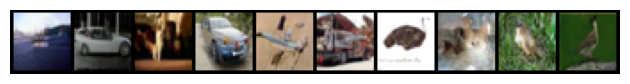

Epoch 991/2000, Loss: 0.0173
Epoch 992/2000, Loss: 0.0317
Epoch 993/2000, Loss: 0.0416
Epoch 994/2000, Loss: 0.0336
Epoch 995/2000, Loss: 0.0207
Epoch 996/2000, Loss: 0.0264
Epoch 997/2000, Loss: 0.0272
Epoch 998/2000, Loss: 0.0243
Epoch 999/2000, Loss: 0.0244
Epoch 1000/2000, Loss: 0.0147


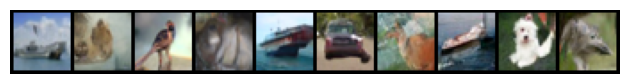

Epoch 1001/2000, Loss: 0.0230
Epoch 1002/2000, Loss: 0.0354
Epoch 1003/2000, Loss: 0.0325
Epoch 1004/2000, Loss: 0.0401
Epoch 1005/2000, Loss: 0.0249
Epoch 1006/2000, Loss: 0.0217
Epoch 1007/2000, Loss: 0.0323
Epoch 1008/2000, Loss: 0.0267
Epoch 1009/2000, Loss: 0.0208
Epoch 1010/2000, Loss: 0.0375


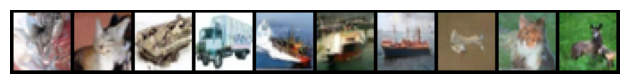

Epoch 1011/2000, Loss: 0.0321
Epoch 1012/2000, Loss: 0.0239
Epoch 1013/2000, Loss: 0.0296
Epoch 1014/2000, Loss: 0.0309
Epoch 1015/2000, Loss: 0.0192
Epoch 1016/2000, Loss: 0.0299
Epoch 1017/2000, Loss: 0.0293
Epoch 1018/2000, Loss: 0.0399
Epoch 1019/2000, Loss: 0.0285
Epoch 1020/2000, Loss: 0.0299


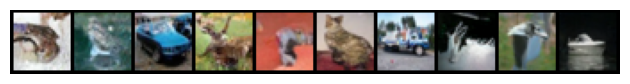

Epoch 1021/2000, Loss: 0.0205
Epoch 1022/2000, Loss: 0.0232
Epoch 1023/2000, Loss: 0.0252
Epoch 1024/2000, Loss: 0.0194
Epoch 1025/2000, Loss: 0.0411
Epoch 1026/2000, Loss: 0.0389
Epoch 1027/2000, Loss: 0.0235
Epoch 1028/2000, Loss: 0.0303
Epoch 1029/2000, Loss: 0.0339
Epoch 1030/2000, Loss: 0.0202


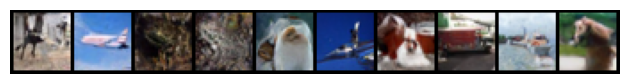

Epoch 1031/2000, Loss: 0.0335
Epoch 1032/2000, Loss: 0.0258
Epoch 1033/2000, Loss: 0.0265
Epoch 1034/2000, Loss: 0.0257
Epoch 1035/2000, Loss: 0.0399
Epoch 1036/2000, Loss: 0.0306
Epoch 1037/2000, Loss: 0.0292
Epoch 1038/2000, Loss: 0.0264
Epoch 1039/2000, Loss: 0.0216
Epoch 1040/2000, Loss: 0.0217


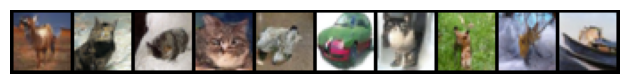

Epoch 1041/2000, Loss: 0.0269
Epoch 1042/2000, Loss: 0.0296
Epoch 1043/2000, Loss: 0.0286
Epoch 1044/2000, Loss: 0.0368
Epoch 1045/2000, Loss: 0.0276
Epoch 1046/2000, Loss: 0.0253
Epoch 1047/2000, Loss: 0.0366
Epoch 1048/2000, Loss: 0.0344
Epoch 1049/2000, Loss: 0.0218
Epoch 1050/2000, Loss: 0.0223


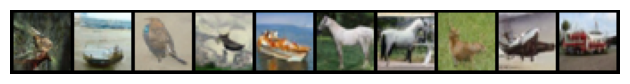

Epoch 1051/2000, Loss: 0.0184
Epoch 1052/2000, Loss: 0.0302
Epoch 1053/2000, Loss: 0.0390
Epoch 1054/2000, Loss: 0.0241
Epoch 1055/2000, Loss: 0.0262
Epoch 1056/2000, Loss: 0.0290
Epoch 1057/2000, Loss: 0.0220
Epoch 1058/2000, Loss: 0.0314
Epoch 1059/2000, Loss: 0.0285
Epoch 1060/2000, Loss: 0.0321


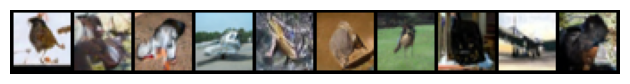

Epoch 1061/2000, Loss: 0.0358
Epoch 1062/2000, Loss: 0.0272
Epoch 1063/2000, Loss: 0.0210
Epoch 1064/2000, Loss: 0.0296
Epoch 1065/2000, Loss: 0.0271
Epoch 1066/2000, Loss: 0.0169
Epoch 1067/2000, Loss: 0.0196
Epoch 1068/2000, Loss: 0.0227
Epoch 1069/2000, Loss: 0.0245
Epoch 1070/2000, Loss: 0.0325


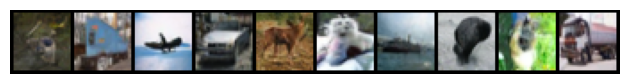

Epoch 1071/2000, Loss: 0.0409
Epoch 1072/2000, Loss: 0.0376
Epoch 1073/2000, Loss: 0.0292
Epoch 1074/2000, Loss: 0.0238
Epoch 1075/2000, Loss: 0.0239
Epoch 1076/2000, Loss: 0.0299
Epoch 1077/2000, Loss: 0.0226
Epoch 1078/2000, Loss: 0.0247
Epoch 1079/2000, Loss: 0.0328
Epoch 1080/2000, Loss: 0.0198


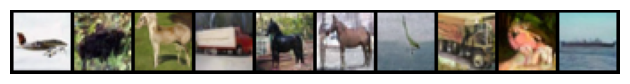

Epoch 1081/2000, Loss: 0.0175
Epoch 1082/2000, Loss: 0.0279
Epoch 1083/2000, Loss: 0.0247
Epoch 1084/2000, Loss: 0.0320
Epoch 1085/2000, Loss: 0.0285
Epoch 1086/2000, Loss: 0.0264
Epoch 1087/2000, Loss: 0.0244
Epoch 1088/2000, Loss: 0.0379
Epoch 1089/2000, Loss: 0.0376
Epoch 1090/2000, Loss: 0.0212


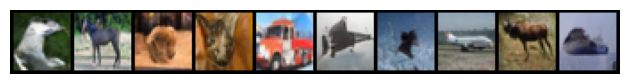

Epoch 1091/2000, Loss: 0.0334
Epoch 1092/2000, Loss: 0.0330
Epoch 1093/2000, Loss: 0.0347
Epoch 1094/2000, Loss: 0.0232
Epoch 1095/2000, Loss: 0.0305
Epoch 1096/2000, Loss: 0.0183
Epoch 1097/2000, Loss: 0.0280
Epoch 1098/2000, Loss: 0.0281
Epoch 1099/2000, Loss: 0.0363
Epoch 1100/2000, Loss: 0.0292


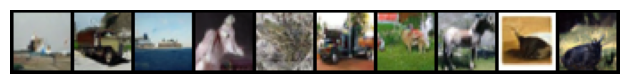

Epoch 1101/2000, Loss: 0.0242
Epoch 1102/2000, Loss: 0.0312
Epoch 1103/2000, Loss: 0.0245
Epoch 1104/2000, Loss: 0.0352
Epoch 1105/2000, Loss: 0.0443
Epoch 1106/2000, Loss: 0.0422
Epoch 1107/2000, Loss: 0.0251
Epoch 1108/2000, Loss: 0.0319
Epoch 1109/2000, Loss: 0.0266
Epoch 1110/2000, Loss: 0.0310


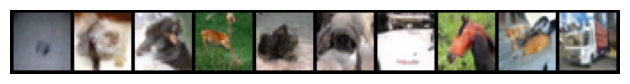

Epoch 1111/2000, Loss: 0.0240
Epoch 1112/2000, Loss: 0.0203
Epoch 1113/2000, Loss: 0.0262
Epoch 1114/2000, Loss: 0.0296
Epoch 1115/2000, Loss: 0.0344
Epoch 1116/2000, Loss: 0.0278
Epoch 1117/2000, Loss: 0.0140
Epoch 1118/2000, Loss: 0.0213
Epoch 1119/2000, Loss: 0.0276
Epoch 1120/2000, Loss: 0.0300


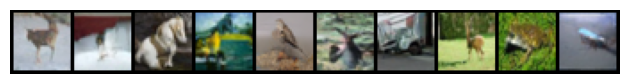

Epoch 1121/2000, Loss: 0.0291
Epoch 1122/2000, Loss: 0.0416
Epoch 1123/2000, Loss: 0.0283
Epoch 1124/2000, Loss: 0.0244
Epoch 1125/2000, Loss: 0.0347
Epoch 1126/2000, Loss: 0.0218
Epoch 1127/2000, Loss: 0.0240
Epoch 1128/2000, Loss: 0.0240
Epoch 1129/2000, Loss: 0.0293
Epoch 1130/2000, Loss: 0.0395


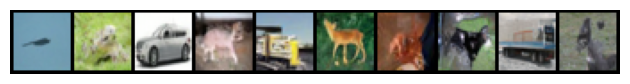

Epoch 1131/2000, Loss: 0.0223
Epoch 1132/2000, Loss: 0.0254
Epoch 1133/2000, Loss: 0.0342
Epoch 1134/2000, Loss: 0.0249
Epoch 1135/2000, Loss: 0.0193
Epoch 1136/2000, Loss: 0.0216
Epoch 1137/2000, Loss: 0.0251
Epoch 1138/2000, Loss: 0.0191
Epoch 1139/2000, Loss: 0.0390
Epoch 1140/2000, Loss: 0.0291


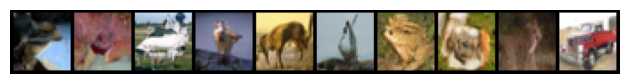

Epoch 1141/2000, Loss: 0.0264
Epoch 1142/2000, Loss: 0.0308
Epoch 1143/2000, Loss: 0.0276
Epoch 1144/2000, Loss: 0.0277
Epoch 1145/2000, Loss: 0.0273
Epoch 1146/2000, Loss: 0.0274
Epoch 1147/2000, Loss: 0.0219
Epoch 1148/2000, Loss: 0.0211
Epoch 1149/2000, Loss: 0.0240
Epoch 1150/2000, Loss: 0.0389


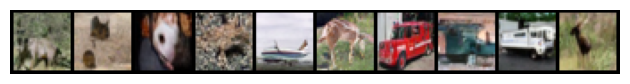

Epoch 1151/2000, Loss: 0.0338
Epoch 1152/2000, Loss: 0.0294
Epoch 1153/2000, Loss: 0.0166
Epoch 1154/2000, Loss: 0.0296
Epoch 1155/2000, Loss: 0.0414
Epoch 1156/2000, Loss: 0.0367
Epoch 1157/2000, Loss: 0.0262
Epoch 1158/2000, Loss: 0.0383
Epoch 1159/2000, Loss: 0.0157
Epoch 1160/2000, Loss: 0.0357


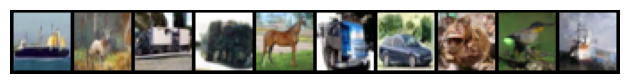

Epoch 1161/2000, Loss: 0.0181
Epoch 1162/2000, Loss: 0.0333
Epoch 1163/2000, Loss: 0.0330
Epoch 1164/2000, Loss: 0.0400
Epoch 1165/2000, Loss: 0.0243
Epoch 1166/2000, Loss: 0.0296
Epoch 1167/2000, Loss: 0.0189
Epoch 1168/2000, Loss: 0.0347
Epoch 1169/2000, Loss: 0.0323
Epoch 1170/2000, Loss: 0.0294


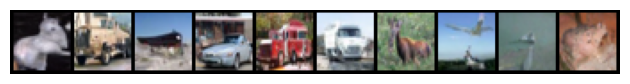

Epoch 1171/2000, Loss: 0.0173
Epoch 1172/2000, Loss: 0.0306
Epoch 1173/2000, Loss: 0.0272
Epoch 1174/2000, Loss: 0.0186
Epoch 1175/2000, Loss: 0.0341
Epoch 1176/2000, Loss: 0.0303
Epoch 1177/2000, Loss: 0.0483
Epoch 1178/2000, Loss: 0.0192
Epoch 1179/2000, Loss: 0.0403
Epoch 1180/2000, Loss: 0.0286


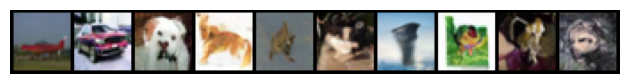

Epoch 1181/2000, Loss: 0.0290
Epoch 1182/2000, Loss: 0.0294
Epoch 1183/2000, Loss: 0.0183
Epoch 1184/2000, Loss: 0.0363
Epoch 1185/2000, Loss: 0.0239
Epoch 1186/2000, Loss: 0.0249
Epoch 1187/2000, Loss: 0.0387
Epoch 1188/2000, Loss: 0.0176
Epoch 1189/2000, Loss: 0.0321
Epoch 1190/2000, Loss: 0.0314


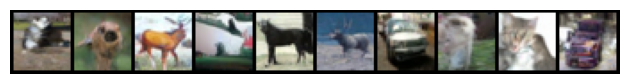

Epoch 1191/2000, Loss: 0.0340
Epoch 1192/2000, Loss: 0.0236
Epoch 1193/2000, Loss: 0.0292
Epoch 1194/2000, Loss: 0.0244
Epoch 1195/2000, Loss: 0.0271
Epoch 1196/2000, Loss: 0.0290
Epoch 1197/2000, Loss: 0.0246
Epoch 1198/2000, Loss: 0.0262
Epoch 1199/2000, Loss: 0.0172
Epoch 1200/2000, Loss: 0.0427


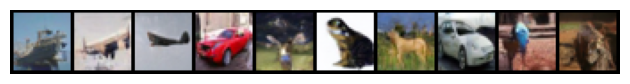

Epoch 1201/2000, Loss: 0.0323
Epoch 1202/2000, Loss: 0.0353
Epoch 1203/2000, Loss: 0.0239
Epoch 1204/2000, Loss: 0.0232
Epoch 1205/2000, Loss: 0.0299
Epoch 1206/2000, Loss: 0.0272
Epoch 1207/2000, Loss: 0.0204
Epoch 1208/2000, Loss: 0.0270
Epoch 1209/2000, Loss: 0.0259
Epoch 1210/2000, Loss: 0.0190


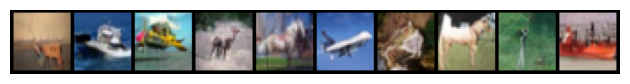

Epoch 1211/2000, Loss: 0.0308
Epoch 1212/2000, Loss: 0.0416
Epoch 1213/2000, Loss: 0.0186
Epoch 1214/2000, Loss: 0.0130
Epoch 1215/2000, Loss: 0.0199
Epoch 1216/2000, Loss: 0.0258
Epoch 1217/2000, Loss: 0.0271
Epoch 1218/2000, Loss: 0.0204
Epoch 1219/2000, Loss: 0.0287
Epoch 1220/2000, Loss: 0.0293


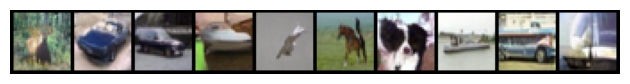

Epoch 1221/2000, Loss: 0.0237
Epoch 1222/2000, Loss: 0.0369
Epoch 1223/2000, Loss: 0.0219
Epoch 1224/2000, Loss: 0.0326
Epoch 1225/2000, Loss: 0.0228
Epoch 1226/2000, Loss: 0.0317
Epoch 1227/2000, Loss: 0.0225
Epoch 1228/2000, Loss: 0.0260
Epoch 1229/2000, Loss: 0.0348
Epoch 1230/2000, Loss: 0.0219


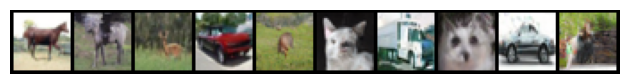

Epoch 1231/2000, Loss: 0.0336
Epoch 1232/2000, Loss: 0.0333
Epoch 1233/2000, Loss: 0.0174
Epoch 1234/2000, Loss: 0.0277
Epoch 1235/2000, Loss: 0.0253
Epoch 1236/2000, Loss: 0.0162
Epoch 1237/2000, Loss: 0.0266
Epoch 1238/2000, Loss: 0.0242
Epoch 1239/2000, Loss: 0.0232
Epoch 1240/2000, Loss: 0.0229


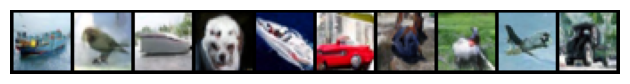

Epoch 1241/2000, Loss: 0.0298
Epoch 1242/2000, Loss: 0.0193
Epoch 1243/2000, Loss: 0.0290
Epoch 1244/2000, Loss: 0.0245
Epoch 1245/2000, Loss: 0.0225
Epoch 1246/2000, Loss: 0.0215
Epoch 1247/2000, Loss: 0.0247
Epoch 1248/2000, Loss: 0.0234
Epoch 1249/2000, Loss: 0.0317
Epoch 1250/2000, Loss: 0.0332


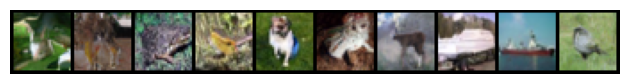

Epoch 1251/2000, Loss: 0.0190
Epoch 1252/2000, Loss: 0.0413
Epoch 1253/2000, Loss: 0.0213
Epoch 1254/2000, Loss: 0.0207
Epoch 1255/2000, Loss: 0.0293
Epoch 1256/2000, Loss: 0.0395
Epoch 1257/2000, Loss: 0.0237
Epoch 1258/2000, Loss: 0.0260
Epoch 1259/2000, Loss: 0.0270
Epoch 1260/2000, Loss: 0.0328


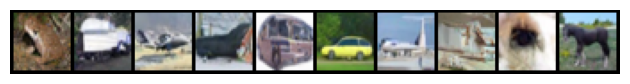

Epoch 1261/2000, Loss: 0.0228
Epoch 1262/2000, Loss: 0.0230
Epoch 1263/2000, Loss: 0.0171
Epoch 1264/2000, Loss: 0.0376
Epoch 1265/2000, Loss: 0.0276
Epoch 1266/2000, Loss: 0.0230
Epoch 1267/2000, Loss: 0.0332
Epoch 1268/2000, Loss: 0.0380
Epoch 1269/2000, Loss: 0.0248
Epoch 1270/2000, Loss: 0.0175


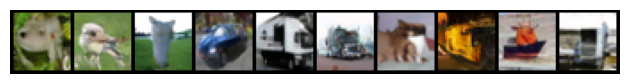

Epoch 1271/2000, Loss: 0.0245
Epoch 1272/2000, Loss: 0.0260
Epoch 1273/2000, Loss: 0.0235
Epoch 1274/2000, Loss: 0.0282
Epoch 1275/2000, Loss: 0.0392
Epoch 1276/2000, Loss: 0.0284
Epoch 1277/2000, Loss: 0.0249
Epoch 1278/2000, Loss: 0.0369
Epoch 1279/2000, Loss: 0.0282
Epoch 1280/2000, Loss: 0.0252


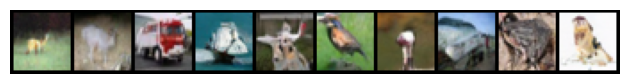

Epoch 1281/2000, Loss: 0.0265
Epoch 1282/2000, Loss: 0.0201
Epoch 1283/2000, Loss: 0.0262
Epoch 1284/2000, Loss: 0.0255
Epoch 1285/2000, Loss: 0.0326
Epoch 1286/2000, Loss: 0.0261
Epoch 1287/2000, Loss: 0.0272
Epoch 1288/2000, Loss: 0.0330
Epoch 1289/2000, Loss: 0.0338
Epoch 1290/2000, Loss: 0.0169


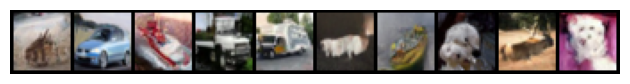

Epoch 1291/2000, Loss: 0.0211
Epoch 1292/2000, Loss: 0.0424
Epoch 1293/2000, Loss: 0.0208
Epoch 1294/2000, Loss: 0.0216
Epoch 1295/2000, Loss: 0.0276
Epoch 1296/2000, Loss: 0.0194
Epoch 1297/2000, Loss: 0.0334
Epoch 1298/2000, Loss: 0.0255
Epoch 1299/2000, Loss: 0.0320
Epoch 1300/2000, Loss: 0.0293


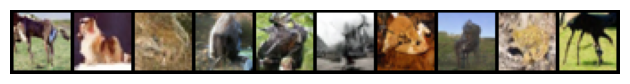

Epoch 1301/2000, Loss: 0.0245
Epoch 1302/2000, Loss: 0.0290
Epoch 1303/2000, Loss: 0.0272
Epoch 1304/2000, Loss: 0.0205
Epoch 1305/2000, Loss: 0.0362
Epoch 1306/2000, Loss: 0.0310
Epoch 1307/2000, Loss: 0.0267
Epoch 1308/2000, Loss: 0.0324
Epoch 1309/2000, Loss: 0.0304
Epoch 1310/2000, Loss: 0.0262


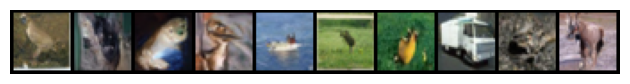

Epoch 1311/2000, Loss: 0.0249
Epoch 1312/2000, Loss: 0.0310
Epoch 1313/2000, Loss: 0.0319
Epoch 1314/2000, Loss: 0.0221
Epoch 1315/2000, Loss: 0.0194
Epoch 1316/2000, Loss: 0.0233
Epoch 1317/2000, Loss: 0.0266
Epoch 1318/2000, Loss: 0.0256
Epoch 1319/2000, Loss: 0.0363
Epoch 1320/2000, Loss: 0.0304


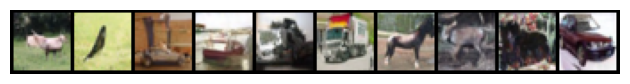

Epoch 1321/2000, Loss: 0.0490
Epoch 1322/2000, Loss: 0.0423
Epoch 1323/2000, Loss: 0.0285
Epoch 1324/2000, Loss: 0.0257
Epoch 1325/2000, Loss: 0.0203
Epoch 1326/2000, Loss: 0.0224
Epoch 1327/2000, Loss: 0.0270
Epoch 1328/2000, Loss: 0.0363
Epoch 1329/2000, Loss: 0.0453
Epoch 1330/2000, Loss: 0.0337


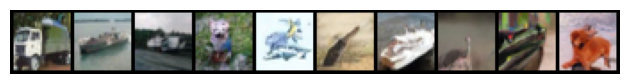

Epoch 1331/2000, Loss: 0.0129
Epoch 1332/2000, Loss: 0.0213
Epoch 1333/2000, Loss: 0.0330
Epoch 1334/2000, Loss: 0.0376
Epoch 1335/2000, Loss: 0.0282
Epoch 1336/2000, Loss: 0.0283
Epoch 1337/2000, Loss: 0.0196
Epoch 1338/2000, Loss: 0.0196
Epoch 1339/2000, Loss: 0.0219
Epoch 1340/2000, Loss: 0.0311


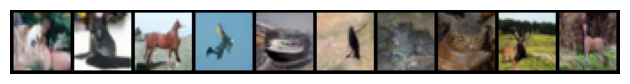

Epoch 1341/2000, Loss: 0.0260
Epoch 1342/2000, Loss: 0.0221
Epoch 1343/2000, Loss: 0.0289
Epoch 1344/2000, Loss: 0.0292
Epoch 1345/2000, Loss: 0.0347
Epoch 1346/2000, Loss: 0.0264
Epoch 1347/2000, Loss: 0.0245
Epoch 1348/2000, Loss: 0.0268
Epoch 1349/2000, Loss: 0.0220
Epoch 1350/2000, Loss: 0.0369


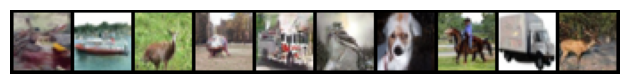

Epoch 1351/2000, Loss: 0.0346
Epoch 1352/2000, Loss: 0.0226
Epoch 1353/2000, Loss: 0.0324
Epoch 1354/2000, Loss: 0.0188
Epoch 1355/2000, Loss: 0.0305
Epoch 1356/2000, Loss: 0.0318
Epoch 1357/2000, Loss: 0.0199
Epoch 1358/2000, Loss: 0.0331
Epoch 1359/2000, Loss: 0.0197
Epoch 1360/2000, Loss: 0.0268


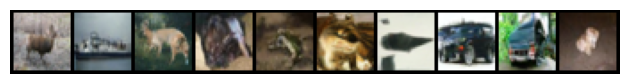

Epoch 1361/2000, Loss: 0.0319
Epoch 1362/2000, Loss: 0.0412
Epoch 1363/2000, Loss: 0.0416
Epoch 1364/2000, Loss: 0.0360
Epoch 1365/2000, Loss: 0.0390
Epoch 1366/2000, Loss: 0.0243
Epoch 1367/2000, Loss: 0.0491
Epoch 1368/2000, Loss: 0.0304
Epoch 1369/2000, Loss: 0.0322
Epoch 1370/2000, Loss: 0.0348


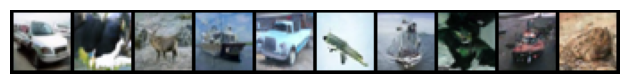

Epoch 1371/2000, Loss: 0.0382
Epoch 1372/2000, Loss: 0.0230
Epoch 1373/2000, Loss: 0.0178
Epoch 1374/2000, Loss: 0.0275
Epoch 1375/2000, Loss: 0.0189
Epoch 1376/2000, Loss: 0.0211
Epoch 1377/2000, Loss: 0.0343
Epoch 1378/2000, Loss: 0.0238
Epoch 1379/2000, Loss: 0.0273
Epoch 1380/2000, Loss: 0.0384


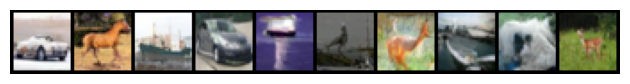

Epoch 1381/2000, Loss: 0.0168
Epoch 1382/2000, Loss: 0.0264
Epoch 1383/2000, Loss: 0.0272
Epoch 1384/2000, Loss: 0.0250
Epoch 1385/2000, Loss: 0.0398
Epoch 1386/2000, Loss: 0.0223
Epoch 1387/2000, Loss: 0.0266
Epoch 1388/2000, Loss: 0.0319
Epoch 1389/2000, Loss: 0.0300
Epoch 1390/2000, Loss: 0.0445


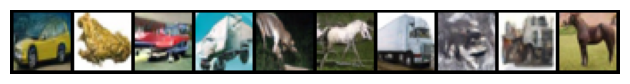

Epoch 1391/2000, Loss: 0.0188
Epoch 1392/2000, Loss: 0.0265
Epoch 1393/2000, Loss: 0.0447
Epoch 1394/2000, Loss: 0.0317
Epoch 1395/2000, Loss: 0.0320
Epoch 1396/2000, Loss: 0.0275
Epoch 1397/2000, Loss: 0.0249
Epoch 1398/2000, Loss: 0.0254
Epoch 1399/2000, Loss: 0.0264
Epoch 1400/2000, Loss: 0.0264


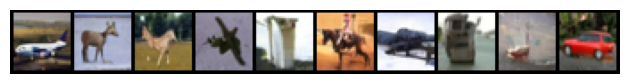

Epoch 1401/2000, Loss: 0.0240
Epoch 1402/2000, Loss: 0.0283
Epoch 1403/2000, Loss: 0.0250
Epoch 1404/2000, Loss: 0.0241
Epoch 1405/2000, Loss: 0.0232
Epoch 1406/2000, Loss: 0.0218
Epoch 1407/2000, Loss: 0.0155
Epoch 1408/2000, Loss: 0.0212
Epoch 1409/2000, Loss: 0.0340
Epoch 1410/2000, Loss: 0.0224


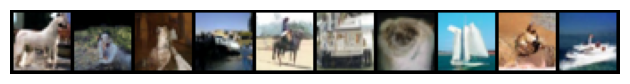

Epoch 1411/2000, Loss: 0.0253
Epoch 1412/2000, Loss: 0.0337
Epoch 1413/2000, Loss: 0.0274
Epoch 1414/2000, Loss: 0.0208
Epoch 1415/2000, Loss: 0.0298
Epoch 1416/2000, Loss: 0.0157
Epoch 1417/2000, Loss: 0.0351
Epoch 1418/2000, Loss: 0.0314
Epoch 1419/2000, Loss: 0.0307
Epoch 1420/2000, Loss: 0.0219


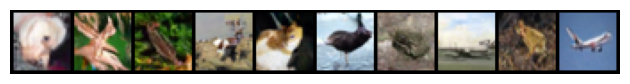

Epoch 1421/2000, Loss: 0.0237
Epoch 1422/2000, Loss: 0.0404
Epoch 1423/2000, Loss: 0.0214
Epoch 1424/2000, Loss: 0.0254
Epoch 1425/2000, Loss: 0.0364
Epoch 1426/2000, Loss: 0.0290
Epoch 1427/2000, Loss: 0.0332
Epoch 1428/2000, Loss: 0.0359
Epoch 1429/2000, Loss: 0.0331
Epoch 1430/2000, Loss: 0.0325


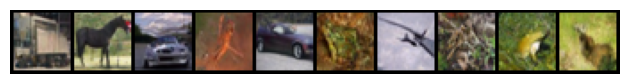

Epoch 1431/2000, Loss: 0.0276
Epoch 1432/2000, Loss: 0.0256
Epoch 1433/2000, Loss: 0.0287
Epoch 1434/2000, Loss: 0.0330
Epoch 1435/2000, Loss: 0.0424
Epoch 1436/2000, Loss: 0.0353
Epoch 1437/2000, Loss: 0.0367
Epoch 1438/2000, Loss: 0.0204
Epoch 1439/2000, Loss: 0.0378
Epoch 1440/2000, Loss: 0.0284


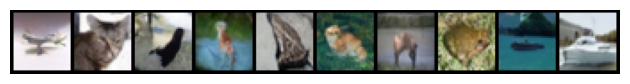

Epoch 1441/2000, Loss: 0.0235
Epoch 1442/2000, Loss: 0.0312
Epoch 1443/2000, Loss: 0.0343
Epoch 1444/2000, Loss: 0.0353
Epoch 1445/2000, Loss: 0.0204
Epoch 1446/2000, Loss: 0.0262
Epoch 1447/2000, Loss: 0.0346
Epoch 1448/2000, Loss: 0.0234
Epoch 1449/2000, Loss: 0.0379
Epoch 1450/2000, Loss: 0.0245


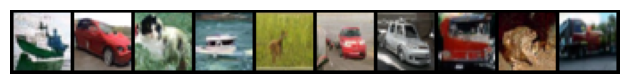

Epoch 1451/2000, Loss: 0.0305
Epoch 1452/2000, Loss: 0.0316
Epoch 1453/2000, Loss: 0.0391
Epoch 1454/2000, Loss: 0.0249
Epoch 1455/2000, Loss: 0.0316
Epoch 1456/2000, Loss: 0.0286
Epoch 1457/2000, Loss: 0.0258
Epoch 1458/2000, Loss: 0.0260
Epoch 1459/2000, Loss: 0.0275
Epoch 1460/2000, Loss: 0.0233


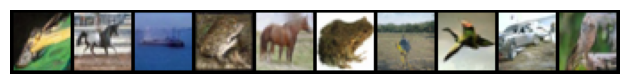

Epoch 1461/2000, Loss: 0.0159
Epoch 1462/2000, Loss: 0.0320
Epoch 1463/2000, Loss: 0.0313
Epoch 1464/2000, Loss: 0.0280
Epoch 1465/2000, Loss: 0.0353
Epoch 1466/2000, Loss: 0.0339
Epoch 1467/2000, Loss: 0.0423
Epoch 1468/2000, Loss: 0.0180
Epoch 1469/2000, Loss: 0.0315
Epoch 1470/2000, Loss: 0.0210


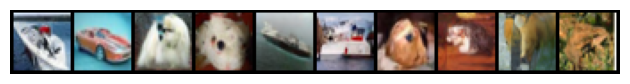

Epoch 1471/2000, Loss: 0.0282
Epoch 1472/2000, Loss: 0.0264
Epoch 1473/2000, Loss: 0.0173
Epoch 1474/2000, Loss: 0.0463
Epoch 1475/2000, Loss: 0.0306
Epoch 1476/2000, Loss: 0.0338
Epoch 1477/2000, Loss: 0.0331
Epoch 1478/2000, Loss: 0.0286
Epoch 1479/2000, Loss: 0.0287
Epoch 1480/2000, Loss: 0.0252


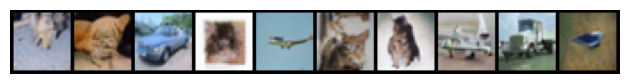

Epoch 1481/2000, Loss: 0.0396
Epoch 1482/2000, Loss: 0.0226
Epoch 1483/2000, Loss: 0.0322
Epoch 1484/2000, Loss: 0.0311
Epoch 1485/2000, Loss: 0.0384
Epoch 1486/2000, Loss: 0.0305
Epoch 1487/2000, Loss: 0.0243
Epoch 1488/2000, Loss: 0.0267
Epoch 1489/2000, Loss: 0.0277
Epoch 1490/2000, Loss: 0.0219


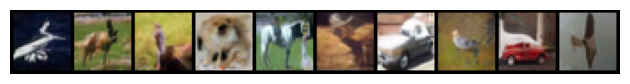

Epoch 1491/2000, Loss: 0.0226
Epoch 1492/2000, Loss: 0.0317
Epoch 1493/2000, Loss: 0.0111
Epoch 1494/2000, Loss: 0.0326
Epoch 1495/2000, Loss: 0.0307
Epoch 1496/2000, Loss: 0.0239
Epoch 1497/2000, Loss: 0.0365
Epoch 1498/2000, Loss: 0.0225
Epoch 1499/2000, Loss: 0.0226
Epoch 1500/2000, Loss: 0.0253


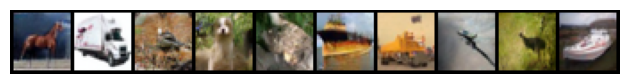

Epoch 1501/2000, Loss: 0.0269
Epoch 1502/2000, Loss: 0.0250
Epoch 1503/2000, Loss: 0.0323
Epoch 1504/2000, Loss: 0.0350
Epoch 1505/2000, Loss: 0.0305
Epoch 1506/2000, Loss: 0.0183
Epoch 1507/2000, Loss: 0.0302
Epoch 1508/2000, Loss: 0.0296
Epoch 1509/2000, Loss: 0.0294
Epoch 1510/2000, Loss: 0.0251


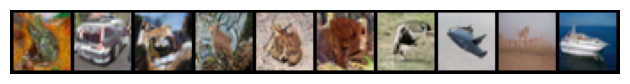

Epoch 1511/2000, Loss: 0.0360
Epoch 1512/2000, Loss: 0.0219
Epoch 1513/2000, Loss: 0.0195
Epoch 1514/2000, Loss: 0.0288
Epoch 1515/2000, Loss: 0.0265
Epoch 1516/2000, Loss: 0.0195
Epoch 1517/2000, Loss: 0.0245
Epoch 1518/2000, Loss: 0.0249
Epoch 1519/2000, Loss: 0.0381
Epoch 1520/2000, Loss: 0.0294


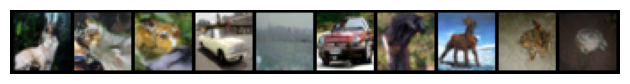

Epoch 1521/2000, Loss: 0.0296
Epoch 1522/2000, Loss: 0.0233
Epoch 1523/2000, Loss: 0.0322
Epoch 1524/2000, Loss: 0.0391
Epoch 1525/2000, Loss: 0.0341
Epoch 1526/2000, Loss: 0.0248
Epoch 1527/2000, Loss: 0.0326
Epoch 1528/2000, Loss: 0.0435
Epoch 1529/2000, Loss: 0.0236
Epoch 1530/2000, Loss: 0.0238


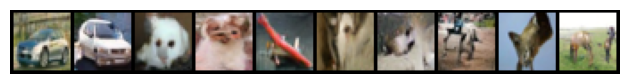

Epoch 1531/2000, Loss: 0.0366
Epoch 1532/2000, Loss: 0.0237
Epoch 1533/2000, Loss: 0.0383
Epoch 1534/2000, Loss: 0.0276
Epoch 1535/2000, Loss: 0.0262
Epoch 1536/2000, Loss: 0.0365
Epoch 1537/2000, Loss: 0.0281
Epoch 1538/2000, Loss: 0.0224
Epoch 1539/2000, Loss: 0.0294
Epoch 1540/2000, Loss: 0.0232


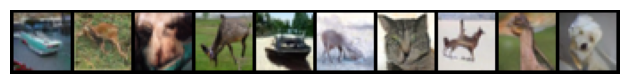

Epoch 1541/2000, Loss: 0.0252
Epoch 1542/2000, Loss: 0.0246
Epoch 1543/2000, Loss: 0.0347
Epoch 1544/2000, Loss: 0.0373
Epoch 1545/2000, Loss: 0.0248
Epoch 1546/2000, Loss: 0.0211
Epoch 1547/2000, Loss: 0.0208
Epoch 1548/2000, Loss: 0.0320
Epoch 1549/2000, Loss: 0.0201
Epoch 1550/2000, Loss: 0.0238


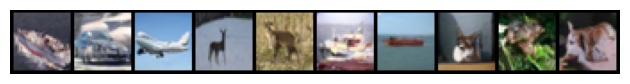

Epoch 1551/2000, Loss: 0.0245
Epoch 1552/2000, Loss: 0.0314
Epoch 1553/2000, Loss: 0.0286
Epoch 1554/2000, Loss: 0.0319
Epoch 1555/2000, Loss: 0.0222
Epoch 1556/2000, Loss: 0.0498
Epoch 1557/2000, Loss: 0.0353
Epoch 1558/2000, Loss: 0.0238
Epoch 1559/2000, Loss: 0.0283
Epoch 1560/2000, Loss: 0.0340


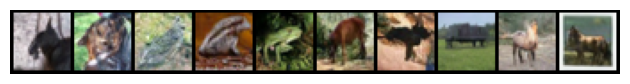

Epoch 1561/2000, Loss: 0.0241
Epoch 1562/2000, Loss: 0.0274
Epoch 1563/2000, Loss: 0.0322
Epoch 1564/2000, Loss: 0.0221
Epoch 1565/2000, Loss: 0.0223
Epoch 1566/2000, Loss: 0.0222
Epoch 1567/2000, Loss: 0.0275
Epoch 1568/2000, Loss: 0.0253
Epoch 1569/2000, Loss: 0.0298
Epoch 1570/2000, Loss: 0.0233


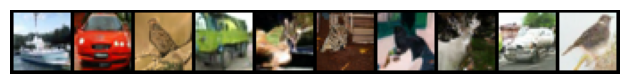

Epoch 1571/2000, Loss: 0.0226
Epoch 1572/2000, Loss: 0.0196
Epoch 1573/2000, Loss: 0.0285
Epoch 1574/2000, Loss: 0.0272
Epoch 1575/2000, Loss: 0.0329
Epoch 1576/2000, Loss: 0.0266
Epoch 1577/2000, Loss: 0.0232
Epoch 1578/2000, Loss: 0.0158
Epoch 1579/2000, Loss: 0.0385
Epoch 1580/2000, Loss: 0.0182


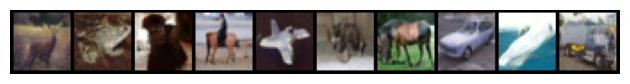

Epoch 1581/2000, Loss: 0.0197
Epoch 1582/2000, Loss: 0.0299
Epoch 1583/2000, Loss: 0.0297
Epoch 1584/2000, Loss: 0.0291
Epoch 1585/2000, Loss: 0.0322
Epoch 1586/2000, Loss: 0.0347
Epoch 1587/2000, Loss: 0.0395
Epoch 1588/2000, Loss: 0.0257
Epoch 1589/2000, Loss: 0.0202
Epoch 1590/2000, Loss: 0.0234


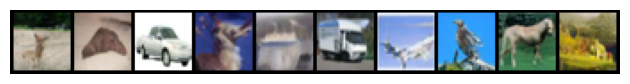

Epoch 1591/2000, Loss: 0.0219
Epoch 1592/2000, Loss: 0.0279
Epoch 1593/2000, Loss: 0.0261
Epoch 1594/2000, Loss: 0.0222
Epoch 1595/2000, Loss: 0.0326
Epoch 1596/2000, Loss: 0.0313
Epoch 1597/2000, Loss: 0.0247
Epoch 1598/2000, Loss: 0.0194
Epoch 1599/2000, Loss: 0.0264
Epoch 1600/2000, Loss: 0.0293


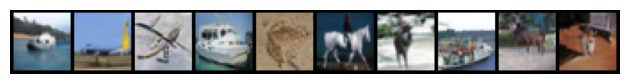

Epoch 1601/2000, Loss: 0.0265
Epoch 1602/2000, Loss: 0.0194
Epoch 1603/2000, Loss: 0.0282
Epoch 1604/2000, Loss: 0.0307
Epoch 1605/2000, Loss: 0.0263
Epoch 1606/2000, Loss: 0.0288
Epoch 1607/2000, Loss: 0.0244
Epoch 1608/2000, Loss: 0.0159
Epoch 1609/2000, Loss: 0.0257
Epoch 1610/2000, Loss: 0.0321


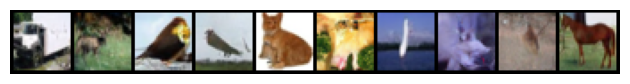

Epoch 1611/2000, Loss: 0.0245
Epoch 1612/2000, Loss: 0.0274
Epoch 1613/2000, Loss: 0.0237
Epoch 1614/2000, Loss: 0.0245
Epoch 1615/2000, Loss: 0.0299
Epoch 1616/2000, Loss: 0.0213
Epoch 1617/2000, Loss: 0.0256
Epoch 1618/2000, Loss: 0.0246
Epoch 1619/2000, Loss: 0.0359
Epoch 1620/2000, Loss: 0.0234


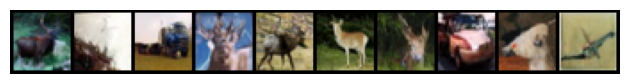

Epoch 1621/2000, Loss: 0.0304
Epoch 1622/2000, Loss: 0.0338
Epoch 1623/2000, Loss: 0.0271
Epoch 1624/2000, Loss: 0.0211
Epoch 1625/2000, Loss: 0.0250
Epoch 1626/2000, Loss: 0.0267
Epoch 1627/2000, Loss: 0.0278
Epoch 1628/2000, Loss: 0.0353
Epoch 1629/2000, Loss: 0.0170
Epoch 1630/2000, Loss: 0.0323


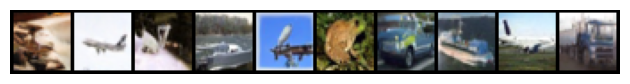

Epoch 1631/2000, Loss: 0.0223
Epoch 1632/2000, Loss: 0.0196
Epoch 1633/2000, Loss: 0.0180
Epoch 1634/2000, Loss: 0.0239
Epoch 1635/2000, Loss: 0.0313
Epoch 1636/2000, Loss: 0.0240
Epoch 1637/2000, Loss: 0.0268
Epoch 1638/2000, Loss: 0.0322
Epoch 1639/2000, Loss: 0.0296
Epoch 1640/2000, Loss: 0.0284


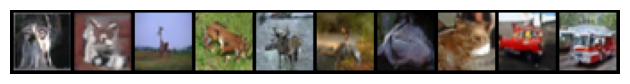

Epoch 1641/2000, Loss: 0.0214
Epoch 1642/2000, Loss: 0.0263
Epoch 1643/2000, Loss: 0.0372
Epoch 1644/2000, Loss: 0.0306
Epoch 1645/2000, Loss: 0.0316
Epoch 1646/2000, Loss: 0.0255
Epoch 1647/2000, Loss: 0.0400
Epoch 1648/2000, Loss: 0.0398
Epoch 1649/2000, Loss: 0.0323
Epoch 1650/2000, Loss: 0.0283


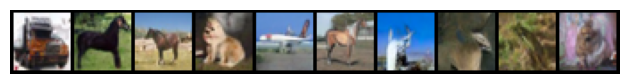

Epoch 1651/2000, Loss: 0.0284
Epoch 1652/2000, Loss: 0.0169
Epoch 1653/2000, Loss: 0.0221
Epoch 1654/2000, Loss: 0.0408
Epoch 1655/2000, Loss: 0.0319
Epoch 1656/2000, Loss: 0.0312
Epoch 1657/2000, Loss: 0.0225
Epoch 1658/2000, Loss: 0.0293
Epoch 1659/2000, Loss: 0.0297
Epoch 1660/2000, Loss: 0.0279


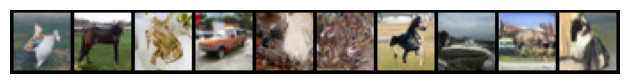

Epoch 1661/2000, Loss: 0.0235
Epoch 1662/2000, Loss: 0.0303
Epoch 1663/2000, Loss: 0.0293
Epoch 1664/2000, Loss: 0.0374
Epoch 1665/2000, Loss: 0.0332
Epoch 1666/2000, Loss: 0.0290
Epoch 1667/2000, Loss: 0.0261
Epoch 1668/2000, Loss: 0.0273
Epoch 1669/2000, Loss: 0.0240
Epoch 1670/2000, Loss: 0.0224


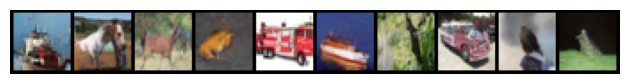

Epoch 1671/2000, Loss: 0.0320
Epoch 1672/2000, Loss: 0.0241
Epoch 1673/2000, Loss: 0.0305
Epoch 1674/2000, Loss: 0.0204
Epoch 1675/2000, Loss: 0.0199
Epoch 1676/2000, Loss: 0.0251
Epoch 1677/2000, Loss: 0.0384
Epoch 1678/2000, Loss: 0.0262
Epoch 1679/2000, Loss: 0.0269
Epoch 1680/2000, Loss: 0.0234


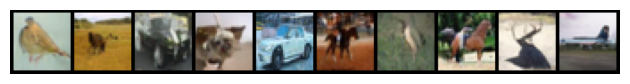

Epoch 1681/2000, Loss: 0.0248
Epoch 1682/2000, Loss: 0.0314
Epoch 1683/2000, Loss: 0.0359
Epoch 1684/2000, Loss: 0.0286
Epoch 1685/2000, Loss: 0.0197
Epoch 1686/2000, Loss: 0.0367
Epoch 1687/2000, Loss: 0.0277
Epoch 1688/2000, Loss: 0.0252
Epoch 1689/2000, Loss: 0.0250
Epoch 1690/2000, Loss: 0.0353


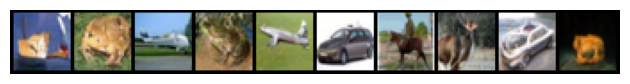

Epoch 1691/2000, Loss: 0.0339
Epoch 1692/2000, Loss: 0.0311
Epoch 1693/2000, Loss: 0.0263
Epoch 1694/2000, Loss: 0.0290
Epoch 1695/2000, Loss: 0.0277
Epoch 1696/2000, Loss: 0.0357
Epoch 1697/2000, Loss: 0.0321
Epoch 1698/2000, Loss: 0.0261
Epoch 1699/2000, Loss: 0.0250
Epoch 1700/2000, Loss: 0.0366


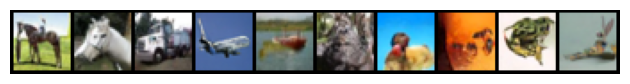

Epoch 1701/2000, Loss: 0.0239
Epoch 1702/2000, Loss: 0.0236
Epoch 1703/2000, Loss: 0.0254
Epoch 1704/2000, Loss: 0.0255
Epoch 1705/2000, Loss: 0.0334
Epoch 1706/2000, Loss: 0.0346
Epoch 1707/2000, Loss: 0.0334
Epoch 1708/2000, Loss: 0.0233
Epoch 1709/2000, Loss: 0.0273
Epoch 1710/2000, Loss: 0.0299


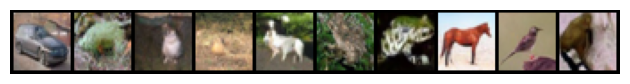

Epoch 1711/2000, Loss: 0.0348
Epoch 1712/2000, Loss: 0.0231
Epoch 1713/2000, Loss: 0.0274
Epoch 1714/2000, Loss: 0.0360
Epoch 1715/2000, Loss: 0.0267
Epoch 1716/2000, Loss: 0.0297
Epoch 1717/2000, Loss: 0.0224
Epoch 1718/2000, Loss: 0.0305
Epoch 1719/2000, Loss: 0.0301
Epoch 1720/2000, Loss: 0.0315


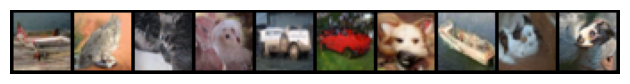

Epoch 1721/2000, Loss: 0.0318
Epoch 1722/2000, Loss: 0.0319
Epoch 1723/2000, Loss: 0.0352
Epoch 1724/2000, Loss: 0.0234
Epoch 1725/2000, Loss: 0.0263
Epoch 1726/2000, Loss: 0.0226
Epoch 1727/2000, Loss: 0.0163
Epoch 1728/2000, Loss: 0.0271
Epoch 1729/2000, Loss: 0.0225
Epoch 1730/2000, Loss: 0.0312


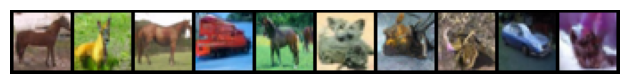

Epoch 1731/2000, Loss: 0.0388
Epoch 1732/2000, Loss: 0.0185
Epoch 1733/2000, Loss: 0.0370
Epoch 1734/2000, Loss: 0.0148
Epoch 1735/2000, Loss: 0.0309
Epoch 1736/2000, Loss: 0.0253
Epoch 1737/2000, Loss: 0.0320
Epoch 1738/2000, Loss: 0.0229
Epoch 1739/2000, Loss: 0.0333
Epoch 1740/2000, Loss: 0.0188


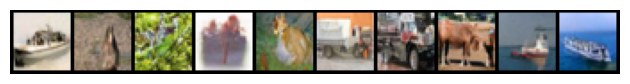

Epoch 1741/2000, Loss: 0.0266
Epoch 1742/2000, Loss: 0.0297
Epoch 1743/2000, Loss: 0.0279
Epoch 1744/2000, Loss: 0.0307
Epoch 1745/2000, Loss: 0.0253
Epoch 1746/2000, Loss: 0.0215
Epoch 1747/2000, Loss: 0.0201
Epoch 1748/2000, Loss: 0.0261
Epoch 1749/2000, Loss: 0.0286
Epoch 1750/2000, Loss: 0.0314


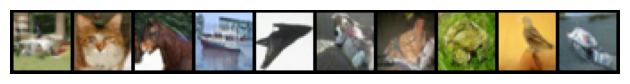

Epoch 1751/2000, Loss: 0.0244
Epoch 1752/2000, Loss: 0.0237
Epoch 1753/2000, Loss: 0.0262
Epoch 1754/2000, Loss: 0.0185
Epoch 1755/2000, Loss: 0.0236
Epoch 1756/2000, Loss: 0.0231
Epoch 1757/2000, Loss: 0.0180
Epoch 1758/2000, Loss: 0.0279
Epoch 1759/2000, Loss: 0.0244
Epoch 1760/2000, Loss: 0.0293


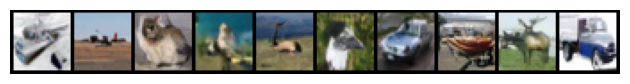

Epoch 1761/2000, Loss: 0.0266
Epoch 1762/2000, Loss: 0.0309
Epoch 1763/2000, Loss: 0.0243
Epoch 1764/2000, Loss: 0.0239
Epoch 1765/2000, Loss: 0.0358
Epoch 1766/2000, Loss: 0.0250
Epoch 1767/2000, Loss: 0.0251
Epoch 1768/2000, Loss: 0.0143
Epoch 1769/2000, Loss: 0.0216
Epoch 1770/2000, Loss: 0.0281


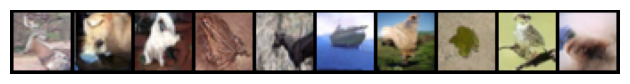

Epoch 1771/2000, Loss: 0.0336
Epoch 1772/2000, Loss: 0.0319
Epoch 1773/2000, Loss: 0.0261
Epoch 1774/2000, Loss: 0.0360
Epoch 1775/2000, Loss: 0.0341
Epoch 1776/2000, Loss: 0.0304
Epoch 1777/2000, Loss: 0.0256
Epoch 1778/2000, Loss: 0.0272
Epoch 1779/2000, Loss: 0.0205
Epoch 1780/2000, Loss: 0.0170


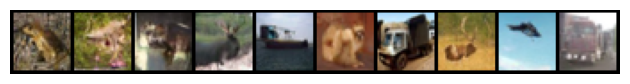

Epoch 1781/2000, Loss: 0.0396
Epoch 1782/2000, Loss: 0.0215
Epoch 1783/2000, Loss: 0.0245
Epoch 1784/2000, Loss: 0.0375
Epoch 1785/2000, Loss: 0.0250
Epoch 1786/2000, Loss: 0.0426
Epoch 1787/2000, Loss: 0.0272
Epoch 1788/2000, Loss: 0.0201
Epoch 1789/2000, Loss: 0.0181
Epoch 1790/2000, Loss: 0.0245


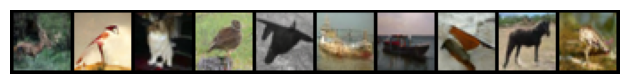

Epoch 1791/2000, Loss: 0.0389
Epoch 1792/2000, Loss: 0.0247
Epoch 1793/2000, Loss: 0.0310
Epoch 1794/2000, Loss: 0.0290
Epoch 1795/2000, Loss: 0.0194
Epoch 1796/2000, Loss: 0.0325
Epoch 1797/2000, Loss: 0.0219
Epoch 1798/2000, Loss: 0.0304
Epoch 1799/2000, Loss: 0.0172
Epoch 1800/2000, Loss: 0.0349


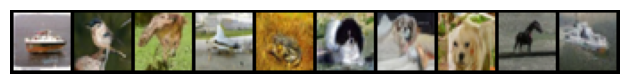

Epoch 1801/2000, Loss: 0.0207
Epoch 1802/2000, Loss: 0.0250
Epoch 1803/2000, Loss: 0.0312
Epoch 1804/2000, Loss: 0.0237
Epoch 1805/2000, Loss: 0.0164
Epoch 1806/2000, Loss: 0.0309
Epoch 1807/2000, Loss: 0.0310
Epoch 1808/2000, Loss: 0.0297
Epoch 1809/2000, Loss: 0.0298
Epoch 1810/2000, Loss: 0.0431


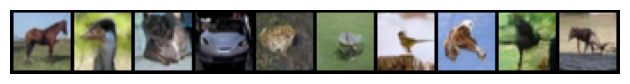

Epoch 1811/2000, Loss: 0.0326
Epoch 1812/2000, Loss: 0.0301
Epoch 1813/2000, Loss: 0.0294
Epoch 1814/2000, Loss: 0.0365
Epoch 1815/2000, Loss: 0.0433
Epoch 1816/2000, Loss: 0.0346
Epoch 1817/2000, Loss: 0.0298
Epoch 1818/2000, Loss: 0.0377
Epoch 1819/2000, Loss: 0.0355
Epoch 1820/2000, Loss: 0.0193


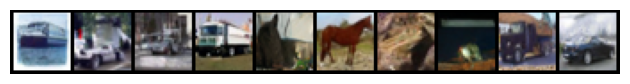

Epoch 1821/2000, Loss: 0.0383
Epoch 1822/2000, Loss: 0.0290
Epoch 1823/2000, Loss: 0.0211
Epoch 1824/2000, Loss: 0.0322
Epoch 1825/2000, Loss: 0.0292
Epoch 1826/2000, Loss: 0.0288
Epoch 1827/2000, Loss: 0.0286
Epoch 1828/2000, Loss: 0.0266
Epoch 1829/2000, Loss: 0.0319
Epoch 1830/2000, Loss: 0.0301


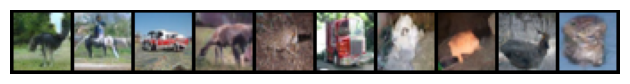

Epoch 1831/2000, Loss: 0.0335
Epoch 1832/2000, Loss: 0.0222
Epoch 1833/2000, Loss: 0.0309
Epoch 1834/2000, Loss: 0.0268
Epoch 1835/2000, Loss: 0.0306
Epoch 1836/2000, Loss: 0.0345
Epoch 1837/2000, Loss: 0.0322
Epoch 1838/2000, Loss: 0.0349
Epoch 1839/2000, Loss: 0.0238
Epoch 1840/2000, Loss: 0.0295


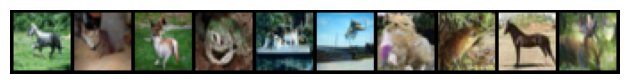

Epoch 1841/2000, Loss: 0.0376
Epoch 1842/2000, Loss: 0.0351
Epoch 1843/2000, Loss: 0.0267
Epoch 1844/2000, Loss: 0.0335
Epoch 1845/2000, Loss: 0.0317
Epoch 1846/2000, Loss: 0.0341
Epoch 1847/2000, Loss: 0.0293
Epoch 1848/2000, Loss: 0.0357
Epoch 1849/2000, Loss: 0.0287
Epoch 1850/2000, Loss: 0.0228


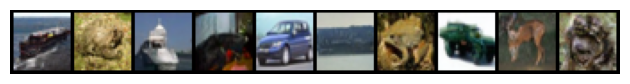

Epoch 1851/2000, Loss: 0.0332
Epoch 1852/2000, Loss: 0.0291
Epoch 1853/2000, Loss: 0.0127
Epoch 1854/2000, Loss: 0.0243
Epoch 1855/2000, Loss: 0.0215
Epoch 1856/2000, Loss: 0.0214
Epoch 1857/2000, Loss: 0.0238
Epoch 1858/2000, Loss: 0.0175
Epoch 1859/2000, Loss: 0.0250
Epoch 1860/2000, Loss: 0.0160


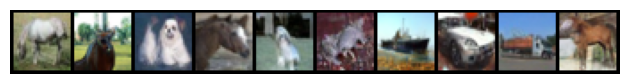

Epoch 1861/2000, Loss: 0.0328
Epoch 1862/2000, Loss: 0.0389
Epoch 1863/2000, Loss: 0.0233
Epoch 1864/2000, Loss: 0.0285
Epoch 1865/2000, Loss: 0.0341
Epoch 1866/2000, Loss: 0.0219
Epoch 1867/2000, Loss: 0.0309
Epoch 1868/2000, Loss: 0.0335
Epoch 1869/2000, Loss: 0.0333
Epoch 1870/2000, Loss: 0.0198


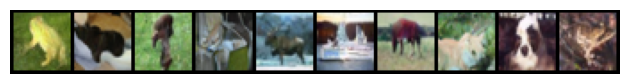

Epoch 1871/2000, Loss: 0.0168
Epoch 1872/2000, Loss: 0.0236
Epoch 1873/2000, Loss: 0.0313
Epoch 1874/2000, Loss: 0.0254
Epoch 1875/2000, Loss: 0.0311
Epoch 1876/2000, Loss: 0.0191
Epoch 1877/2000, Loss: 0.0337
Epoch 1878/2000, Loss: 0.0241
Epoch 1879/2000, Loss: 0.0211
Epoch 1880/2000, Loss: 0.0307


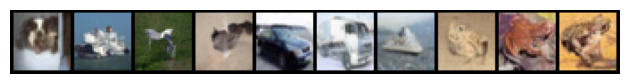

Epoch 1881/2000, Loss: 0.0400
Epoch 1882/2000, Loss: 0.0271
Epoch 1883/2000, Loss: 0.0245
Epoch 1884/2000, Loss: 0.0215
Epoch 1885/2000, Loss: 0.0403
Epoch 1886/2000, Loss: 0.0345
Epoch 1887/2000, Loss: 0.0244
Epoch 1888/2000, Loss: 0.0426
Epoch 1889/2000, Loss: 0.0222
Epoch 1890/2000, Loss: 0.0220


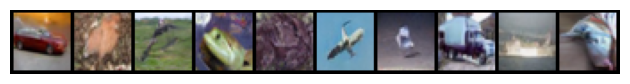

Epoch 1891/2000, Loss: 0.0320
Epoch 1892/2000, Loss: 0.0270
Epoch 1893/2000, Loss: 0.0291
Epoch 1894/2000, Loss: 0.0186
Epoch 1895/2000, Loss: 0.0392
Epoch 1896/2000, Loss: 0.0253
Epoch 1897/2000, Loss: 0.0212
Epoch 1898/2000, Loss: 0.0270
Epoch 1899/2000, Loss: 0.0270
Epoch 1900/2000, Loss: 0.0247


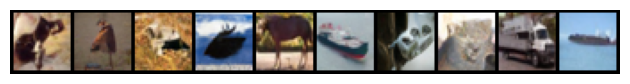

Epoch 1901/2000, Loss: 0.0254
Epoch 1902/2000, Loss: 0.0252
Epoch 1903/2000, Loss: 0.0324
Epoch 1904/2000, Loss: 0.0206
Epoch 1905/2000, Loss: 0.0247
Epoch 1906/2000, Loss: 0.0450
Epoch 1907/2000, Loss: 0.0377
Epoch 1908/2000, Loss: 0.0356
Epoch 1909/2000, Loss: 0.0390
Epoch 1910/2000, Loss: 0.0236


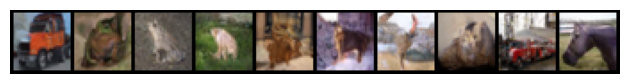

Epoch 1911/2000, Loss: 0.0169
Epoch 1912/2000, Loss: 0.0212
Epoch 1913/2000, Loss: 0.0238
Epoch 1914/2000, Loss: 0.0253
Epoch 1915/2000, Loss: 0.0339
Epoch 1916/2000, Loss: 0.0302
Epoch 1917/2000, Loss: 0.0330
Epoch 1918/2000, Loss: 0.0254
Epoch 1919/2000, Loss: 0.0421
Epoch 1920/2000, Loss: 0.0242


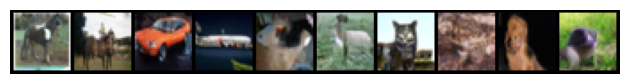

Epoch 1921/2000, Loss: 0.0158
Epoch 1922/2000, Loss: 0.0212
Epoch 1923/2000, Loss: 0.0339
Epoch 1924/2000, Loss: 0.0338
Epoch 1925/2000, Loss: 0.0258
Epoch 1926/2000, Loss: 0.0143
Epoch 1927/2000, Loss: 0.0249
Epoch 1928/2000, Loss: 0.0243
Epoch 1929/2000, Loss: 0.0411
Epoch 1930/2000, Loss: 0.0230


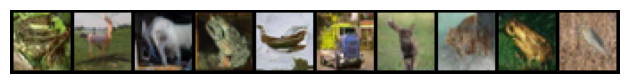

Epoch 1931/2000, Loss: 0.0486
Epoch 1932/2000, Loss: 0.0268
Epoch 1933/2000, Loss: 0.0265
Epoch 1934/2000, Loss: 0.0275
Epoch 1935/2000, Loss: 0.0324
Epoch 1936/2000, Loss: 0.0203
Epoch 1937/2000, Loss: 0.0301
Epoch 1938/2000, Loss: 0.0248
Epoch 1939/2000, Loss: 0.0391
Epoch 1940/2000, Loss: 0.0292


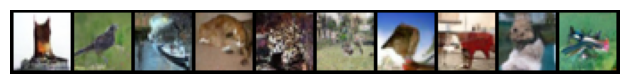

Epoch 1941/2000, Loss: 0.0220
Epoch 1942/2000, Loss: 0.0299
Epoch 1943/2000, Loss: 0.0296
Epoch 1944/2000, Loss: 0.0386
Epoch 1945/2000, Loss: 0.0249
Epoch 1946/2000, Loss: 0.0332
Epoch 1947/2000, Loss: 0.0361
Epoch 1948/2000, Loss: 0.0187
Epoch 1949/2000, Loss: 0.0314
Epoch 1950/2000, Loss: 0.0460


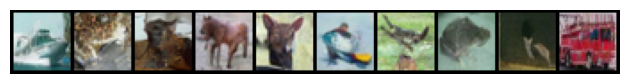

Epoch 1951/2000, Loss: 0.0271
Epoch 1952/2000, Loss: 0.0246
Epoch 1953/2000, Loss: 0.0324
Epoch 1954/2000, Loss: 0.0268
Epoch 1955/2000, Loss: 0.0244
Epoch 1956/2000, Loss: 0.0240
Epoch 1957/2000, Loss: 0.0228
Epoch 1958/2000, Loss: 0.0320
Epoch 1959/2000, Loss: 0.0135
Epoch 1960/2000, Loss: 0.0339


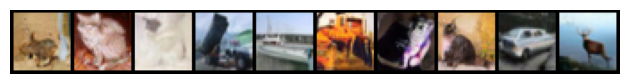

Epoch 1961/2000, Loss: 0.0279
Epoch 1962/2000, Loss: 0.0279
Epoch 1963/2000, Loss: 0.0313
Epoch 1964/2000, Loss: 0.0340
Epoch 1965/2000, Loss: 0.0378
Epoch 1966/2000, Loss: 0.0290
Epoch 1967/2000, Loss: 0.0248
Epoch 1968/2000, Loss: 0.0210
Epoch 1969/2000, Loss: 0.0263
Epoch 1970/2000, Loss: 0.0325


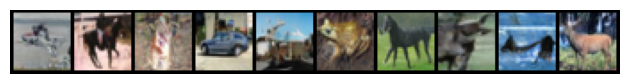

Epoch 1971/2000, Loss: 0.0316
Epoch 1972/2000, Loss: 0.0227
Epoch 1973/2000, Loss: 0.0222
Epoch 1974/2000, Loss: 0.0336
Epoch 1975/2000, Loss: 0.0158
Epoch 1976/2000, Loss: 0.0407
Epoch 1977/2000, Loss: 0.0212
Epoch 1978/2000, Loss: 0.0222
Epoch 1979/2000, Loss: 0.0309
Epoch 1980/2000, Loss: 0.0295


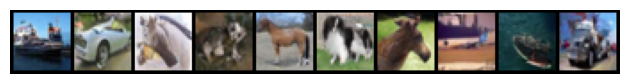

Epoch 1981/2000, Loss: 0.0191
Epoch 1982/2000, Loss: 0.0368
Epoch 1983/2000, Loss: 0.0371
Epoch 1984/2000, Loss: 0.0383
Epoch 1985/2000, Loss: 0.0370
Epoch 1986/2000, Loss: 0.0307
Epoch 1987/2000, Loss: 0.0348
Epoch 1988/2000, Loss: 0.0347
Epoch 1989/2000, Loss: 0.0216
Epoch 1990/2000, Loss: 0.0357


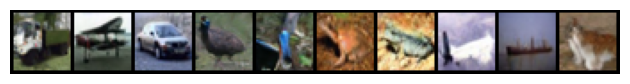

Epoch 1991/2000, Loss: 0.0267
Epoch 1992/2000, Loss: 0.0218
Epoch 1993/2000, Loss: 0.0269
Epoch 1994/2000, Loss: 0.0188
Epoch 1995/2000, Loss: 0.0226
Epoch 1996/2000, Loss: 0.0327
Epoch 1997/2000, Loss: 0.0301
Epoch 1998/2000, Loss: 0.0221
Epoch 1999/2000, Loss: 0.0244
Epoch 2000/2000, Loss: 0.0336


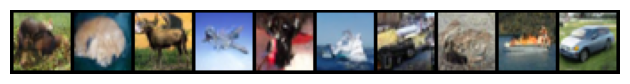

In [ ]:
# ----------------------------------------------------------------------
# Hyperparameters and training settings
# ----------------------------------------------------------------------
image_ch       = 3
image_size     = 32       # CIFAR10 is already 32x32 so no resizing
base_ch        = 128
t_dim          = 512
epochs         = 2000
batch_size     = 128


# ----------------------------------------------------------------------
# CIFAR10 dataset loading and preprocessing
# ----------------------------------------------------------------------
transform = transforms.Compose([
    transforms.ToTensor(),
    transforms.RandomHorizontalFlip(),  # Random horizontal flip
    transforms.Lambda(lambda x: x * 2 -1)
])
dataset = datasets.CIFAR10(
    root="./data",
    train=True,
    download=True,
    transform=transform,
)
dataloader = DataLoader(dataset, batch_size=batch_size, shuffle=True)


# ----------------------------------------------------------------------
# UNet model initialization and optimizer settings
# ----------------------------------------------------------------------
model = UNet(image_ch, base_ch, t_dim).to(device)

optimizer = torch.optim.Adam(model.parameters(), lr=2e-4)

# ----------------------------------------------------------------------
# EMA model settings
# ----------------------------------------------------------------------
ema_model = copy.deepcopy(model)
ema_model.eval()  # Set to evaluation mode
ema_decay = 0.9999

# ----------------------------------------------------------------------
# Training loop
# ----------------------------------------------------------------------
for epoch in range(1,epochs+1):
    for x_0, _ in dataloader:
        # Transfer image data to device
        x_0 = x_0.to(device)

        # Generate noisy image from random time steps
        t = torch.randint(0, T, (x_0.size(0),), device=device)
        x_t, epsilon = sample_q(x_0, t)  # Return noise as label

        # Perform noise prediction and calculate loss
        noise_pred = model(x_t, t)
        loss = F.mse_loss(noise_pred, epsilon)

        # Calculate gradients and update parameters
        optimizer.zero_grad()
        loss.backward()
        optimizer.step()

        # Update EMA model
        with torch.no_grad():
            for ema_param, param in zip(ema_model.parameters(),
                                        model.parameters()):
                ema_param.data.mul_(ema_decay).add_(param.data, alpha=1 - ema_decay)

    print(f"Epoch {epoch}/{epochs}, Loss: {loss.item():.4f}")

    if epoch % 10 == 0 or epoch == epochs:
        # Generate and display sample images during training
        with torch.no_grad():
            # Generate images from noisy images
            noise = torch.randn(10, image_ch, image_size, image_size).to(device)
            samples = sample(ema_model, noise)
        show_images(samples)

        # Save EMA model
        model_path = f'DDPM-CIFAR10-{epoch:03d}.pth'  # Model save path
        torch.save(ema_model.state_dict(), model_path)


## 100 Generated CIFAR10 Images

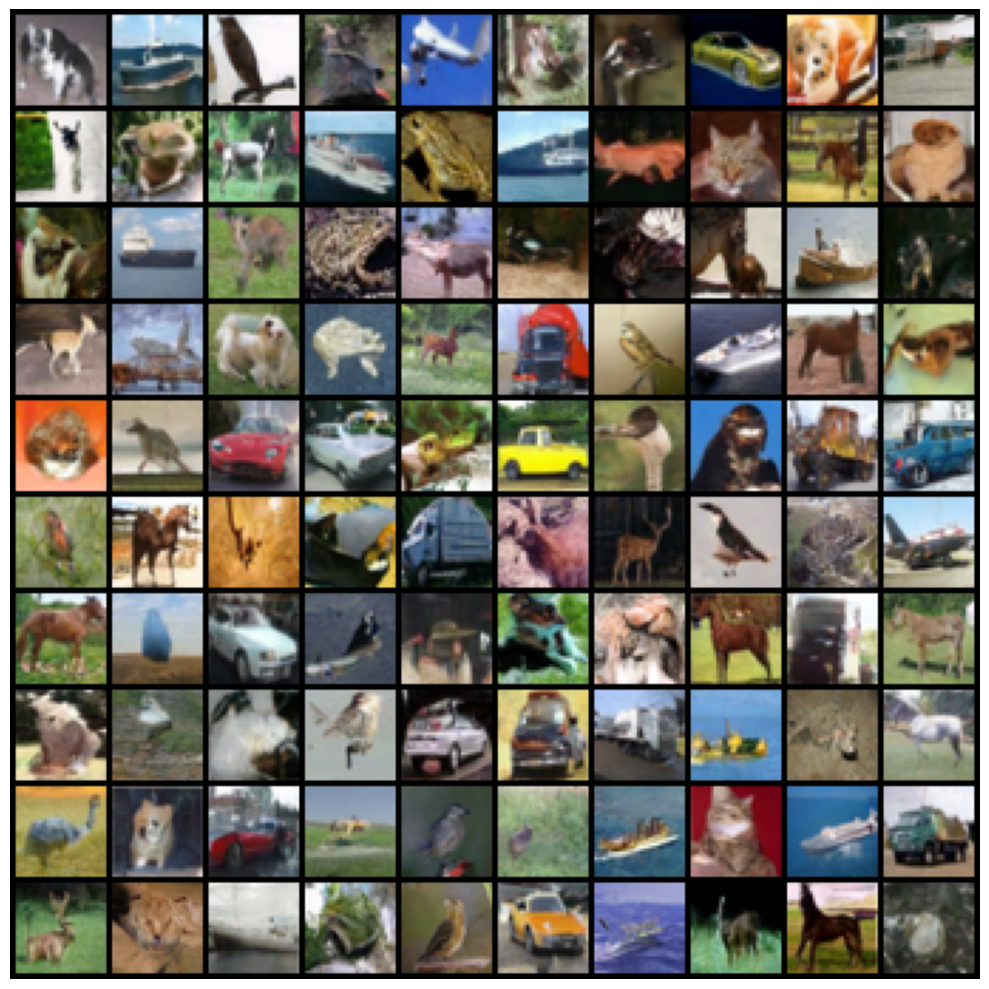

In [ ]:

model_path = f'DDPM-CIFAR10-2000.pth'  # Model save path

# Load pre-trained model
model = UNet(image_ch, base_ch, t_dim).to(device)
model.load_state_dict(torch.load(model_path, map_location=device))

# Use pre-trained model to generate images
model.eval()
with torch.no_grad():
    # Generate images from noisy images
    noise = torch.randn(100, image_ch, image_size, image_size).to(device)
    samples = sample(model, noise)

plt.figure(figsize=(10, 10))
show_images(samples, 10)

## Compare with Real CIFAR10 Images

torch.Size([3, 342, 342])


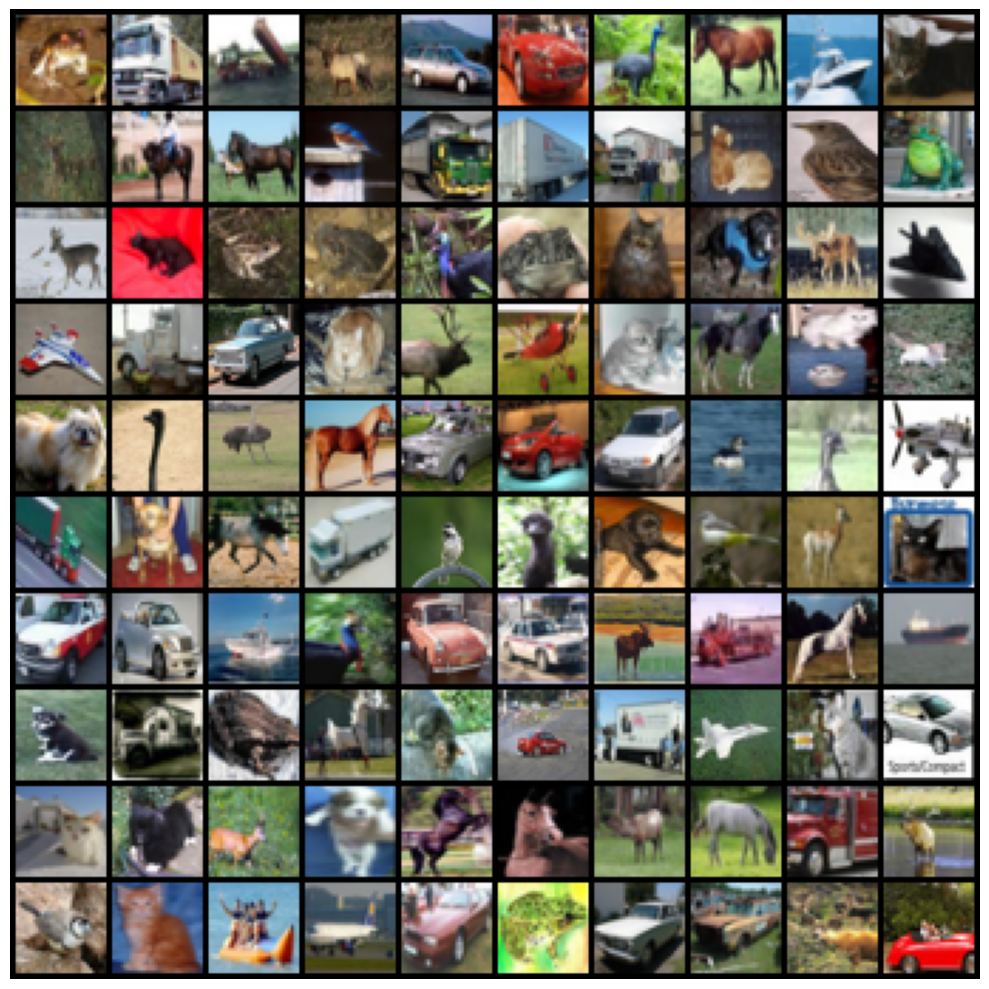

In [ ]:

data = torch.FloatTensor(dataset.data)[:100]  # [100, 32, 32, 3]
data = data.permute(0, 3, 1, 2)         # [100, 3, 32, 32]
data = (data / 255.0) # Normalize to [0, 1]
grid = utils.make_grid(data, nrow=10, padding=2)

plt.figure(figsize=(10, 10))
plt.imshow(grid.permute(1, 2, 0).numpy())  # (B, C, H, W) -> (B, H, W, C)
plt.axis('off')
plt.tight_layout()
plt.show()